#### Importing Libraries

In [327]:
import warnings
warnings.filterwarnings("ignore")
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.metrics import confusion_matrix
import math
import joblib
from sklearn.metrics import mean_squared_error, mean_pinball_loss, r2_score, classification_report, confusion_matrix, mean_absolute_percentage_error
from imblearn.over_sampling import SMOTENC
import lightgbm as lgb


#### Constants

In [328]:
PATH_TO_CVS = 'output/output-energy/'
# This constant contains the unique quantile to represent in the scatter plot of residuals 
ONLY_QUANTILE = 0.95
# A selection of node metrics to represent in the boxplot and in the scatter plot 
COL_TO_PLOT = ['cpu_usage_idle_node', 'cpu_usage_node', 'ram_usage_idle_node', 'ram_usage_node', 'power_usage_idle_node', 'power_usage_node']
# List containing the values whose quantile regression is to be calculated
QUANTILES = [0.05, 0.95]
NODE_TYPES = ["LIGHT", "MID", "HEAVY"]
#
SEED = 4850
NUM_TRAINING_EXPERIMENTS = 5

#### Utilities functions

In [329]:
# Function used to fill NaN values within the dataframe X
def fill_NaN(X):
  for col in X:
    if(col.startswith('success_rate_')):
      X.loc[:, col] = X.loc[:, col].fillna(1)
    else:
      X.loc[:, col] = X.loc[:, col].fillna(0)
  return X

In [330]:
# Function to reweight of dataframe
def resample_dataset(X, y):
  X_resampled, y_resampled = resample(X, y, replace=True, random_state=42)
  return X_resampled, y_resampled

In [331]:
# Function used to split the dataset into training and test set
def split_dataset(X, y):
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
  return X_train, X_test, y_train, y_test

In [332]:
def convert_dataset(X_train, X_test, y_train, y_test):
  X_train_nn = X_train.astype(np.float32)
  X_test_nn = X_test.astype(np.float32)
  y_train_nn = y_train.astype(np.float32)
  y_test_nn = y_test.astype(np.float32)
  
  return X_train_nn, X_test_nn, y_train_nn, y_test_nn

In [333]:
# Function used to calculate the weighted mean squared error
def wmse_score(y_true, y_pred):
  # Calculates the weight of classes for the first target  
  median_cpu = y_true['cpu_usage_node'].median()
  w_majority_cpu = y_true[y_true['cpu_usage_node'] <= median_cpu].shape[0] / y_true.shape[0]
  w_minority_cpu = y_true[y_true['cpu_usage_node'] > median_cpu].shape[0] / y_true.shape[0]

  # Calculate the weight of classes for the second target
  median_ram = y_true['ram_usage_node'].median()
  w_majority_ram = y_true[y_true['ram_usage_node'] <= median_ram].shape[0] / y_true.shape[0]
  w_minority_ram = y_true[y_true['ram_usage_node'] > median_ram].shape[0] / y_true.shape[0]

  # Calculates the MSE for both targets
  mse_cpu = mean_squared_error(y_true['cpu_usage_node'], y_pred['cpu_usage_node'])
  mse_ram = mean_squared_error(y_true['ram_usage_node'], y_pred['ram_usage_node'])

  # Calculates WMSE as a weighted average of the MSEs for the two targets
  wmse = (w_majority_cpu * mse_cpu * y_true.shape[0] / (w_majority_cpu * y_true[y_true['cpu_usage_node'] <= median_cpu].shape[0] + w_minority_cpu * y_true[y_true['cpu_usage_node'] > median_cpu].shape[0]) +
          w_majority_ram * mse_ram * y_true.shape[0] / (w_majority_ram * y_true[y_true['ram_usage_node'] <= median_ram].shape[0] + w_minority_ram * y_true[y_true['ram_usage_node'] > median_ram].shape[0])) / 2

  return wmse

In [334]:
# Function used to calculate metrics based on the task
def metrics(task_type, y_test, y_pred, quantile):
  if(task_type == 'regression'):
    mape = mean_absolute_percentage_error(y_test, y_pred)
    print("mape:", mape)
    mse = mean_squared_error(y_test, y_pred)
    print("mse:", mse)
    rmse = math.sqrt(mse)
    print("rmse:", rmse)
    r2 = r2_score(y_test, y_pred)
    print("R-squared score:", r2)
    std_dev = float(np.std(y_pred))
    print("Standard deviation:", std_dev)
    if quantile != 0:
      quantile_loss = mean_pinball_loss(y_test, y_pred, alpha=quantile)
      print("Quantile loss with library: ", quantile_loss)
    else:
      quantile_loss = "Not calculated for this target"
    return {"mape": mape, "mse": mse, "rmse": rmse, "r2": r2, "quantile_loss": quantile_loss, "std_dev": std_dev}    
  elif(task_type.endswith('classification')):
    report = classification_report(y_test, y_pred)
    print("Classification Report:\n", report)
    return {}

In [335]:
# Function used to plot the regression lines for the 2 targets
def plot_regression(y_test, y_pred, target_name, plot_folder = None):
    # Calculate the regression lines
    m, q = np.polyfit(y_test.ravel(), y_pred.ravel(), 1)

    # Plot the regression lines
    plt.plot(y_test, y_pred, 'o', color='red', fillstyle='none')
    plt.plot(y_test, m*y_test + q, linestyle='--')
    plt.xlabel('Observed values', fontsize = 14)
    plt.ylabel('Predicted values', fontsize = 14)
    plt.title('Regression of ' + target_name)
    plt.xlim(0, 1)  
    plt.ylim(0, 1)  
    plt.legend(fontsize = 14)
    if plot_folder is not None:
        plt.savefig(os.path.join(plot_folder, f"{target_name}.png"), dpi = 300, format = "png", bbox_inches = "tight")
        plt.close()
    else:
        plt.show()

    # Calculate residuals 
    residuals = y_test.flatten() - y_pred.flatten()

    # Scatter plot with regression line
    sns.scatterplot(x=y_test.flatten(), y=residuals, label=f'Observations')

    # Add the horizontal line near the value 0.0 of the y-axis
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
    plt.xlabel('Observed values', fontsize = 14)
    plt.ylabel('Residuals (Observed - Predicted values)')
    plt.title(f'Standard Regression - {target_name}')
    plt.legend(fontsize = 14)
    if plot_folder is not None:
        plt.savefig(os.path.join(plot_folder, f"{target_name}_residuals.png"), dpi = 300, format = "png", bbox_inches = "tight")
        plt.close()
    else:
        plt.show()

In [336]:
# Function used to plots quantile regression results.
def plot_quantile_regression(y_test, y_pred, target_name, plot_folder = None):
    point = 1
    line = 3
    for col in y_pred:
        m, q = np.polyfit(y_test.ravel(), y_pred[col], 1)
        plt.plot(y_test, y_pred[col], 'o', fillstyle='none', label=f'Observations - {col}')
        plt.plot(y_test, m*y_test + q, linestyle='--', zorder = line)
        point = point + 1
        line = line + 1
    plt.xlabel('Observed values', fontsize = 14)
    plt.ylabel('Predicted values', fontsize = 14)
    plt.title('Quantile Regression of ' + target_name)
    plt.xlim(0, 1)  
    plt.ylim(0, 1)  
    plt.legend(fontsize = 14)
    if plot_folder is not None:
        plt.savefig(os.path.join(plot_folder, f"{target_name}_quantile.png"), dpi = 300, format = "png", bbox_inches = "tight")
        plt.close()
    else:
        plt.show()

    # Calculate quantile residuals
    residuals = y_test.flatten() - y_pred[str(ONLY_QUANTILE)]

    # Scatter plot with regression line
    sns.scatterplot(x=y_test.flatten(), y=residuals, label=f'Observations')

    # Add the horizontal line near the value 0.0 of the y-axis
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
    plt.xlabel('Observed values', fontsize = 14)
    plt.ylabel('Quantile residuals (Observed - Predicted values)')
    plt.title(f'Quantile Regression {ONLY_QUANTILE} - {target_name}')
    plt.legend(fontsize = 14)
    if plot_folder is not None:
        plt.savefig(os.path.join(plot_folder, f"{target_name}_quantile_residuals.png"), dpi = 300, format = "png", bbox_inches = "tight")
        plt.close()
    else:
        plt.show()

In [337]:
# Function used to plot the confusion matrix
def plot_confusion_matrix(y_test, y_pred, target):
  # Calculate the confusion matrix
  cm = confusion_matrix(y_test[target], y_pred[target])

  # Plot the confusion matrix as heatmap
  sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
  plt.xlabel('Valori osservati')
  plt.ylabel('Valori predetti')
  plt.title('Confusion matrix')
  plt.show()

In [338]:
# Function used to train the desired model for a target variable
def train_model(target_name, X_train, y_train, quantile):
    # Classification task. Create model with autogluon
    if target_name.startswith('overloaded') or target_name.startswith('replica'):
        model_type = ""
        model = lgb.LGBMClassifier()
    # Quantile regression with LGBM
    elif quantile != 0:
        model = lgb.LGBMRegressor(objective='quantile', alpha=quantile)
        model_type = "quantile" + str(quantile).replace('.', '')
    # Regression with LGBM
    else:
        model = lgb.LGBMRegressor(objective='regression')
        model_type = "regression"
    
    model.fit(X_train, y_train)
    path = './system-forecaster-models/functions/' + target_name + "/" + model_type
    if not os.path.exists(path):
        os.makedirs(path)
    joblib.dump(model, path + "/model.joblib")
    return model



In [ ]:
# Function to obtain a barchart of the type of nodes
def plot_node_type_distribution(df):
    """
    Visualizza il numero di dati per ogni tipologia di nodo in un DataFrame tramite un bar chart.

    :param df: DataFrame contenente la colonna 'node_type' con le tipologie di nodo.
    """
    # Count of occurrences for each node type
    node_counts = df['node_type'].value_counts()

    # Bar chart
    plt.figure(figsize=(10, 6))
    node_counts.plot(kind='bar')
    plt.title('Distribuzione del Numero di Dati per Tipologia di Nodo')
    plt.xlabel('Tipologia di Nodo (1 = Heavy, 2 = Mid, 3 = Light)')
    plt.ylabel('Numero di Righe')
    plt.xticks(rotation=0)  # Maintains names of horizontal node types
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

In [340]:
# Function to obtain a barchart of overloaded node distribution
def plot_overloaded_node_distribution(df):
    """
    Visualizza il numero di righe in cui 'overloaded_node' è 1 e quelle in cui è 0.

    :param df: DataFrame contenente la colonna 'overloaded_node'.
    """
    # Count of occurrences of 0 and 1 in the 'overloaded_node' column
    overloaded_counts = df['overloaded_node'].value_counts()

    # Bar chart
    plt.figure(figsize=(8, 5))
    overloaded_counts.plot(kind='bar')
    plt.title('Distribuzione di Nodi Sovraccaricati')
    plt.xlabel('Stato Sovraccarico (0 = No, 1 = Sì)')
    plt.ylabel('Numero di Righe')
    plt.xticks(rotation=0)  
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

In [341]:
# Function to split train/test sets
def build_train_test_data(targets, target_datasets, features_datasets):
    # Initialize dictionaries to store scaled data and train-test splits
    x_train_dict = {}
    x_test_dict = {}
    y_train_dict = {}
    y_test_dict = {}
    y_scalers = {}
    scaler_exist = False

    for target_name in targets:
        # Get the target dataset for the current iteration
        target_dataset = target_datasets[target_name]    

        # Apply scaling for x (features)
        X = features_datasets[target_name]
        scaler_x = MinMaxScaler()
        scaler_x.fit(X)
        X_scaled = scaler_x.transform(X)

        # Apply scaling for y (target)
        scaler_y = MinMaxScaler()
        scaler_y.fit(target_dataset)
        y_scalers[target_name] = scaler_y
        if target_name.startswith('overloaded') or target_name.startswith('replica'):
            y_scaled = target_dataset
        else:
            y_scaled = scaler_y.transform(target_dataset)
        
        # Save the scaler for x
        scaler_x_path = './scalers/functions/scaler_x/' 
        if not os.path.exists(scaler_x_path):
            os.makedirs(scaler_x_path)
        if target_name.startswith('overloaded'):
            joblib.dump(scaler_x, scaler_x_path + "/" + target_name + ".joblib")
        elif not scaler_exist:
            scaler_exist = True
            joblib.dump(scaler_x, scaler_x_path + "/features.joblib")

        # Save the scaler for y
        scaler_y_path = './scalers/functions/scaler_y/'
        if not os.path.exists(scaler_y_path):
            os.makedirs(scaler_y_path)
        if not target_name.startswith("overloaded"):
            joblib.dump(scaler_y, scaler_y_path + "/" + target_name + ".joblib")

        # Split the dataset into training and testing
        x_train, x_test, y_train, y_test = train_test_split(X_scaled, y_scaled)
        x_train_dict[target_name] = x_train
        x_test_dict[target_name] = x_test
        y_train_dict[target_name] = y_train
        y_test_dict[target_name] = y_test
    
    return x_train_dict, x_test_dict, y_train_dict, y_test_dict, y_scalers

In [342]:
# Function to train One Model for each target variable
def train_all_models(targets, x_train_dict, y_train_dict):
    #Initialize a dictionary to store models
    trained_models = {}
    for target_name in targets:
        #Get the corresponding x_train for the current target
        x_train = x_train_dict[target_name]

        # Get the corresponding y_train for the current target
        y_train = y_train_dict[target_name]

        #Trains the specific model for the current target
        model = train_model(target_name, x_train, y_train, 0)  # Use the specific target's y_train
        trained_models[target_name] = model
        if not(target_name.startswith('overloaded') or target_name.startswith('replica')):
            for quantile in QUANTILES:
                model = train_model(target_name, x_train, y_train, quantile)
                trained_models[target_name + " " + str(quantile)] = model
    return trained_models

In [343]:
# Function to compute predictions and evaluate all models
def evaluate_all_models(trained_models, targets, params, x_test_dict, y_test_dict):
    # Initialize dictionary to store predictions
    all_predictions = {}
    for target_name in targets:

        # Get the test dataset for the current iteration
        x_test = x_test_dict[target_name]
        y_test = y_test_dict[target_name]
        test_data = pd.DataFrame(np.column_stack((x_test, y_test)), columns=[*params, target_name])

        # Get model, predict and compute metrics
        model = trained_models[target_name]
        y_pred = model.predict(test_data.drop(columns=[target_name]))
        all_predictions[target_name] = y_pred
        if not(target_name.startswith('overloaded') or target_name.startswith('replica')):
            y_pred_quantiles = {}
            for quantile in QUANTILES:
                model = trained_models[target_name + " " + str(quantile)]
                y_pred_quantiles[str(quantile)] = model.predict(test_data.drop(columns=[target_name]))
            all_predictions[target_name + " quantiles"] = y_pred_quantiles
    
    return all_predictions

In [344]:
# Function to compute prediction metrics and plot results
def compute_metrics_and_plot(all_predictions, y_test_dict, y_scalers, plot_folder = None):
    quantiles_string = [str(q) for q in QUANTILES]
    all_metrics = {}
    all_metrics_no_scale = {}
    for target_name, y_pred in all_predictions.items():
        print(f"Target: {target_name}")

        if target_name.startswith('overloaded'):
            task_type = 'binary classification'
        elif target_name.startswith('replica'):
            task_type = 'classification'
        else:
            task_type = 'regression'

        if target_name.endswith('quantiles'):
            # Get the test dataset for the current iteration
            trunc_target = target_name[0:target_name.index(' ')]
            y_test = y_test_dict[trunc_target]
            y_test_df = pd.DataFrame(y_test, columns=[trunc_target])
            y_pred_df = pd.DataFrame(y_pred, columns=quantiles_string)
            for quantile in QUANTILES:
                statistics = (y_pred_df[str(quantile)] > y_test_df[trunc_target]).value_counts(normalize=True)
                if statistics.size > 1:
                    true_percentage, false_percentage = statistics[True], statistics[False]
                    print(f"Prediction for alpha {quantile} are greater than true values in {true_percentage * 100} % of cases and less or equal in {false_percentage * 100} % of cases.")
                all_metrics[target_name] = metrics(task_type, y_test_df, y_pred_df[str(quantile)], quantile) 
            plot_quantile_regression(y_test, y_pred_df, trunc_target, plot_folder)
            # metrics on non-scaled predictions
            y_test_df_not_scaled = pd.DataFrame()
            for col in y_test_df:
                y_test_df_not_scaled[col] = [y[0] for y in y_scalers[trunc_target].inverse_transform(pd.DataFrame(y_test_df[col])).tolist()]
            y_pred_df_not_scaled = pd.DataFrame()
            for col in y_pred_df:
                y_pred_df_not_scaled[col] = [y[0] for y in y_scalers[trunc_target].inverse_transform(pd.DataFrame(y_pred_df[col])).tolist()]
            all_metrics_no_scale[target_name] = metrics(task_type, y_test_df_not_scaled, y_pred_df_not_scaled[str(quantile)], quantile) 
        else:
            y_test = y_test_dict[target_name]
            y_test_df = pd.DataFrame(y_test, columns=[target_name])
            y_pred_df = pd.DataFrame(y_pred, columns=[target_name])
            all_metrics[target_name] = metrics(task_type, y_test_df, y_pred_df, 0)
            if task_type == 'regression':
                plot_regression(y_test, y_pred, target_name, plot_folder)
            # metrics on non-scaled predictions
            y_test_df_not_scaled = pd.DataFrame()
            for col in y_test_df:
                y_test_df_not_scaled[col] = [y[0] for y in y_scalers[target_name].inverse_transform(pd.DataFrame(y_test_df[col])).tolist()]
            y_pred_df_not_scaled = pd.DataFrame()
            for col in y_pred_df:
                y_pred_df_not_scaled[col] = [y[0] for y in y_scalers[target_name].inverse_transform(pd.DataFrame(y_pred_df[col])).tolist()]
            all_metrics_no_scale[target_name] = metrics(task_type, y_test_df_not_scaled, y_pred_df_not_scaled, 0) 
        
        print("-" * 30)

    all_metrics = pd.DataFrame(all_metrics).transpose().sort_index()
    all_metrics["metric"] = all_metrics.index
    all_metrics_no_scale = pd.DataFrame(all_metrics_no_scale).transpose().sort_index()
    all_metrics_no_scale["metric"] = all_metrics_no_scale.index
    return all_metrics, all_metrics_no_scale

#### Retrieving dataset

In [345]:
df = pd.DataFrame()
for node_type in NODE_TYPES:
    # Retrieve all files in the output folder
    file_csv = [file for file in os.listdir(PATH_TO_CVS + node_type) if file.endswith('.csv')]
    # Create the dataframe by concatenating all read files
    dataframes = []
    for file in file_csv:
        file_path = os.path.join(PATH_TO_CVS + node_type, file)
        df_temp = pd.read_csv(file_path)    
        # Remove the columns in the dataframe that begin with "function_"
        df_temp.drop(columns=[col for col in df_temp if col.startswith('function_')], inplace=True)        
        # Aggiungi la colonna "node_type" e assegna il valore di 'type' a tutte le righe
        if node_type == "HEAVY":
            df_temp["node_type"] = 1
        elif node_type == "MID":
            df_temp["node_type"] = 2
        else: 
            df_temp["node_type"] = 3
        
        dataframes.append(df_temp)
        
    df = pd.concat([df, *dataframes], axis=0, ignore_index=True)

df = fill_NaN(df)

functions = [col[14:] for col in df if col.startswith('rate')]

for function in functions:
    df.loc[df['rate_function_' + function] == 0, ['cpu_usage_function_' + function, 'ram_usage_function_' + function, 'power_usage_function_' + function, 'replica_' + function]] = 0

In [346]:
df

,rate_function_shasum,success_rate_function_shasum,cpu_usage_function_shasum,ram_usage_function_shasum,power_usage_function_shasum,replica_shasum,overloaded_function_shasum,medium_latency_function_shasum,rate_function_curl,success_rate_function_curl,...,overloaded_function_env,medium_latency_function_env,rate_function_figlet,success_rate_function_figlet,cpu_usage_function_figlet,ram_usage_function_figlet,power_usage_function_figlet,replica_figlet,overloaded_function_figlet,medium_latency_function_figlet
0,100.0,1.0,7.691,4042069.333,11739.653,2.0,0.0,107580927.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
1,100.0,1.0,7.751,9199274.667,16427.020,1.0,0.0,16880204.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
2,100.0,1.0,8.378,9214634.667,14245.149,2.0,0.0,35575151.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
3,100.0,1.0,8.793,1366357.333,24734.177,2.0,0.0,76360433.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
4,100.0,1.0,7.820,1323008.000,17732.391,2.0,0.0,87032021.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98779,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,13967111.0,70.0,1.0,10.414,1.344819e+07,27201.168,1.0,0.0,16680711.0
98780,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,12078762.0,70.0,1.0,10.012,1.713152e+06,27538.105,1.0,0.0,15961359.0
98781,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,12159595.0,70.0,1.0,8.494,1.336299e+07,25525.116,1.0,0.0,15225328.0
98782,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,16766710.0,70.0,1.0,9.619,1.337362e+07,28618.911,1.0,0.0,38791520.0


In [347]:
df.to_csv(os.path.join(PATH_TO_CVS, "all_results.csv"), index = False)

In [348]:
df.columns

Index(['rate_function_shasum', 'success_rate_function_shasum',
       'cpu_usage_function_shasum', 'ram_usage_function_shasum',
       'power_usage_function_shasum', 'replica_shasum',
       'overloaded_function_shasum', 'medium_latency_function_shasum',
       'rate_function_curl', 'success_rate_function_curl',
       'cpu_usage_function_curl', 'ram_usage_function_curl',
       'power_usage_function_curl', 'replica_curl', 'overloaded_function_curl',
       'medium_latency_function_curl', 'rate_function_eat-memory',
       'success_rate_function_eat-memory', 'cpu_usage_function_eat-memory',
       'ram_usage_function_eat-memory', 'power_usage_function_eat-memory',
       'replica_eat-memory', 'overloaded_function_eat-memory',
       'medium_latency_function_eat-memory', 'cpu_usage_idle_node',
       'cpu_usage_node', 'ram_usage_idle_node', 'ram_usage_node',
       'ram_usage_idle_node_percentage', 'ram_usage_node_percentage',
       'power_usage_idle_node', 'power_usage_node', 'rest_se

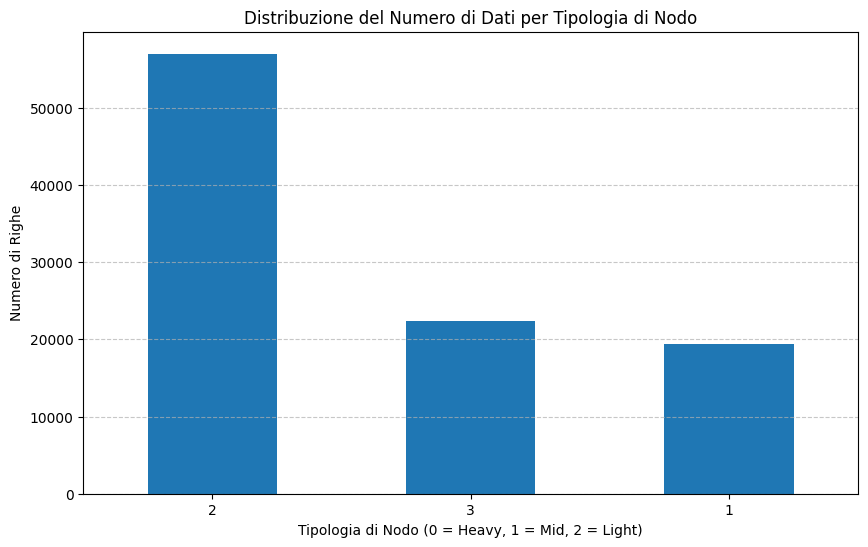

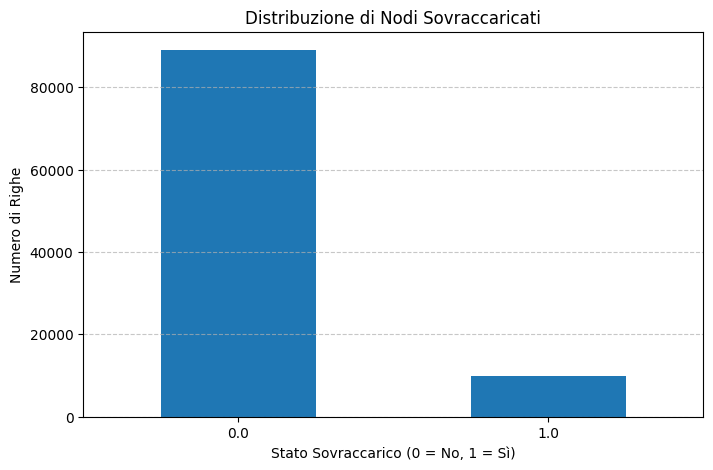

In [349]:
# Plot node type distribution
plot_node_type_distribution(df)
# Plot overloaded node distribution
plot_overloaded_node_distribution(df)

#### Removing outliers

In [350]:
# Iterate over each target column and handle outliers
functions_column = [col for col in df if col.startswith('rate')]
targets = [col for col in df if (col.startswith('power_usage_') or col.startswith('cpu_usage_') or col.startswith('ram_usage_') or col.startswith('overloaded_node') or col.startswith('medium_latency')) and 'idle' not in col]
grouped = df.groupby(functions_column + ['node_type'])
threshold = 1
for target in targets:
    print(target)
    if target != 'overloaded_node':
        mean = grouped[target].transform('mean')
        std = grouped[target].transform('std')
        outliers = (df[target] > mean + threshold * std) | (df[target] < mean - threshold * std)
        print(outliers.sum())
        df[target] = df[target].where(~outliers, mean)
    else:
        new_overloaded = grouped[target].transform('all')
        df['overloaded_node'] = new_overloaded.astype(int)
        print(df["overloaded_node"].value_counts())
df_only_useful = df[functions_column + targets + ["node_type"]]

cpu_usage_function_shasum
23887
ram_usage_function_shasum
23430
power_usage_function_shasum
23895
medium_latency_function_shasum
23610
cpu_usage_function_curl
14017
ram_usage_function_curl
13650
power_usage_function_curl
13997
medium_latency_function_curl
13920
cpu_usage_function_eat-memory
4571
ram_usage_function_eat-memory
4501
power_usage_function_eat-memory
4595
medium_latency_function_eat-memory
4564
cpu_usage_node
32752
ram_usage_node
32400
ram_usage_node_percentage
32140
power_usage_node
32498
overloaded_node
overloaded_node
0    90739
1     8045
Name: count, dtype: int64
cpu_usage_function_nmap
7319
ram_usage_function_nmap
7245
power_usage_function_nmap
7318
medium_latency_function_nmap
7301
cpu_usage_function_env
19397
ram_usage_function_env
18812
power_usage_function_env
19415
medium_latency_function_env
19202
cpu_usage_function_figlet
19900
ram_usage_function_figlet
19762
power_usage_function_figlet
19876
medium_latency_function_figlet
19790


In [351]:
df_only_useful.to_csv(
  os.path.join(PATH_TO_CVS, "all_results_no_outliers.csv"), index = False
)
df_only_useful

,rate_function_shasum,rate_function_curl,rate_function_eat-memory,rate_function_nmap,rate_function_env,rate_function_figlet,cpu_usage_function_shasum,ram_usage_function_shasum,power_usage_function_shasum,medium_latency_function_shasum,...,medium_latency_function_nmap,cpu_usage_function_env,ram_usage_function_env,power_usage_function_env,medium_latency_function_env,cpu_usage_function_figlet,ram_usage_function_figlet,power_usage_function_figlet,medium_latency_function_figlet,node_type
0,100.0,60.0,0.0,0.0,0.0,0.0,7.691,4042069.333,11739.653000,37454241.5,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,3
1,100.0,60.0,0.0,0.0,0.0,0.0,7.751,9199274.667,13542.554250,16880204.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,3
2,100.0,60.0,0.0,0.0,0.0,0.0,8.378,9214634.667,14245.149000,35575151.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,3
3,100.0,60.0,10.0,0.0,0.0,0.0,8.261,1366357.333,20280.961333,76360433.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,3
4,100.0,60.0,10.0,0.0,0.0,0.0,7.820,1323008.000,17732.391000,87032021.0,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000,0.000000,0.000000e+00,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98779,0.0,0.0,0.0,70.0,20.0,70.0,0.000,0.000,0.000000,0.0,...,1.655140e+10,2.024333,1.616555e+06,8605.155000,1.278133e+07,10.196000,5607879.111,27201.168000,1.611891e+07,1
98780,0.0,0.0,0.0,70.0,20.0,70.0,0.000,0.000,0.000000,0.0,...,1.697898e+10,2.011000,1.553067e+06,8346.938000,1.207876e+07,10.012000,1713152.000,27538.105000,1.596136e+07,1
98781,0.0,0.0,0.0,70.0,30.0,70.0,0.000,0.000,0.000000,0.0,...,1.728170e+10,2.889333,1.520640e+06,12787.386333,1.444850e+07,9.990167,7250379.020,28735.254833,1.522533e+07,1
98782,0.0,0.0,0.0,70.0,30.0,70.0,0.000,0.000,0.000000,0.0,...,1.793603e+10,2.822000,1.727829e+06,13041.002000,1.444850e+07,9.619000,7250379.020,28618.911000,2.362620e+07,1


#### Partitioning into features and targets and oversampling

In [352]:
# Dataframe division by features and output
targets = [col for col in df if (col.startswith('power_usage_') or col.startswith('cpu_usage_') or col.startswith('ram_usage_') or col.startswith('overloaded_node') or col.startswith('medium_latency')) and 'idle' not in col]# or col.startswith('replica')
params = [col for col in df if col.startswith('rate_') or 'node_type' in col]

# Initialize a dictionary to store target datasets
target_datasets = {}
features_datasets = {}
features_datasets['original'] = df[params]
for target_name in targets:
    X = df[params]
    y = df[[target_name]]
    node_type_index = X.columns.get_loc("node_type")

    if "overloaded" in target_name:
        print("Status of target: " + target_name)
        print(y.value_counts())
        # Oversampling
        sm = SMOTENC(random_state=42, categorical_features=[node_type_index])
        try:
            X_res, y_res = sm.fit_resample(X, y)
            print("Status after SMOTE:")
            print(y_res.value_counts())
            print(X_res["node_type"].value_counts())
            features_datasets[target_name] = X_res
            y = y_res
        except:
            print("It was not possible to perform SMOTE for target " + target_name)
    else:
        if "node" not in target_name:
            function_name = target_name.split("_")[-1]
            # Drop rows whose input rate is zero
            X_res = df[df[f"rate_function_{function_name}"] > 0][params]
            y = df[df[f"rate_function_{function_name}"] > 0][[target_name]]
            features_datasets[target_name] = X_res
        else:
            # Drop rows where input rate is zero for all functions
            X_res = df[df[params].ne(0).sum(axis=1).ge(2)][params]
            y = df[df[params].ne(0).sum(axis=1).ge(2)][[target_name]]
            features_datasets[target_name] = X_res

    target_datasets[target_name] = y

Status of target: overloaded_node
overloaded_node
0                  90739
1                   8045
Name: count, dtype: int64
Status after SMOTE:
overloaded_node
0                  90739
1                  90739
Name: count, dtype: int64
node_type
2    84236
3    65824
1    31418
Name: count, dtype: int64


#### Preprocessing

In [353]:
# Initialize dictionaries to store scaled data and train-test splits
x_train_dict, x_test_dict, y_train_dict, y_test_dict, y_scalers = build_train_test_data(targets, target_datasets, features_datasets)

#### Train models

In [354]:
# Train one model per target variable
trained_models = train_all_models(targets, x_train_dict, y_train_dict)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.278421
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.037736
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, y

#### Predict

In [355]:
# Compute predictions on the test set
all_predictions = evaluate_all_models(trained_models, targets, params, x_test_dict, y_test_dict)

#### Plot results

Target: cpu_usage_function_shasum
mape: 0.14442520759306152
mse: 0.0002982123011455227
rmse: 0.01726882454440726
R-squared score: 0.9885671241042597
Standard deviation: 0.16035316930148635


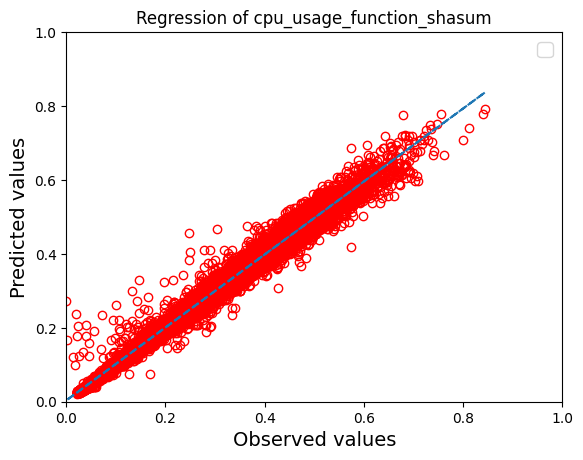

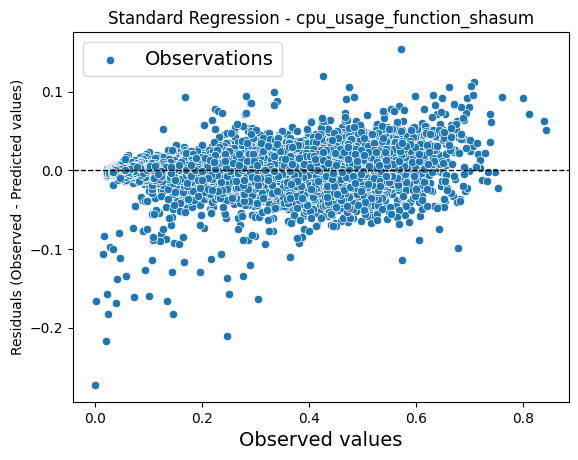

mape: 0.06427000918741238
mse: 0.30994788591619105
rmse: 0.5567296344871459
R-squared score: 0.9885671241042597
Standard deviation: 5.169625825110619
------------------------------
Target: cpu_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 4.538132533466645 % of cases and less or equal in 95.46186746653336 % of cases.
mape: 0.1707496937079917
mse: 0.0020538244057350325
rmse: 0.04531913950788378
R-squared score: 0.9212603925048932
Standard deviation: 0.1397503528763852
Quantile loss with library:  0.0018704780127240632
Prediction for alpha 0.95 are greater than true values in 95.19524523690495 % of cases and less or equal in 4.80475476309504 % of cases.
mape: 0.2881627459326161
mse: 0.0011480355772064614
rmse: 0.03388267370215139
R-squared score: 0.9559865631710108
Standard deviation: 0.16879394510793708
Quantile loss with library:  0.0015565835310978335


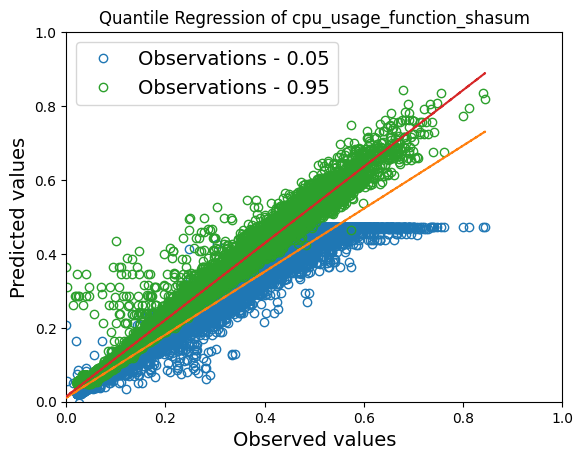

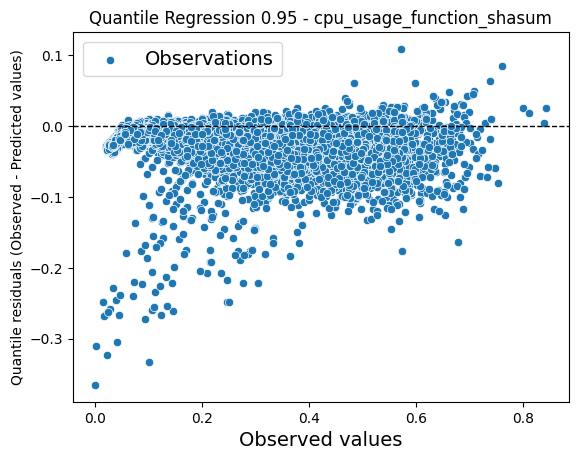

mape: 0.1734616812911086
mse: 1.1932143601885723
rmse: 1.0923435174836587
R-squared score: 0.9559865631710108
Standard deviation: 5.441747996334783
Quantile loss with library:  0.05018269645906306
------------------------------
Target: ram_usage_function_shasum
mape: 4015326291.1758676
mse: 0.002822497453847558
rmse: 0.05312718187375986
R-squared score: 0.8427444005596212
Standard deviation: 0.11978528364707683


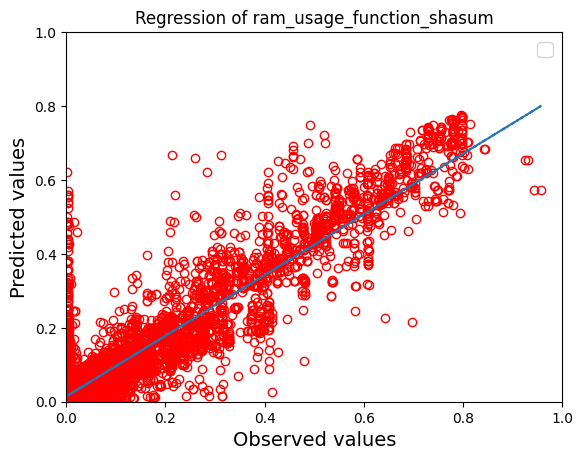

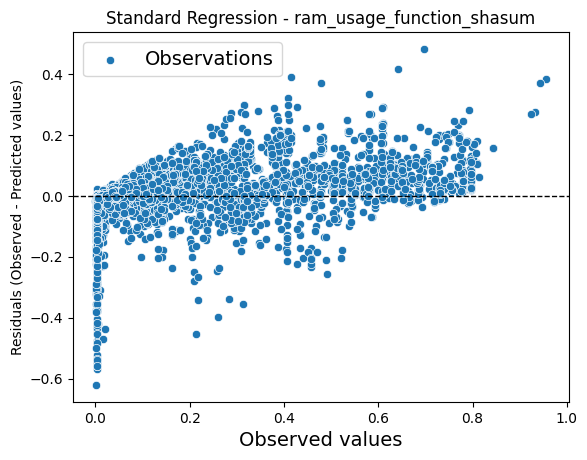

mape: 1.8903715560774272
mse: 168301195899011.1
rmse: 12973095.077852897
R-squared score: 0.8427444005596212
Standard deviation: 29250297.472462732
------------------------------
Target: ram_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.499083486085652 % of cases and less or equal in 94.50091651391435 % of cases.
mape: 391014772.9091918
mse: 0.01665083137177479
rmse: 0.12903810046561748
R-squared score: 0.0722980228096497
Standard deviation: 0.04787684101434481
Quantile loss with library:  0.0034014973033343466
Prediction for alpha 0.95 are greater than true values in 95.42853968782981 % of cases and less or equal in 4.571460312170194 % of cases.
mape: 17103878962.433178
mse: 0.00940776660059936
rmse: 0.09699364206276286
R-squared score: 0.4758457712138189
Standard deviation: 0.1480006299424027
Quantile loss with library:  0.0036730121989466493


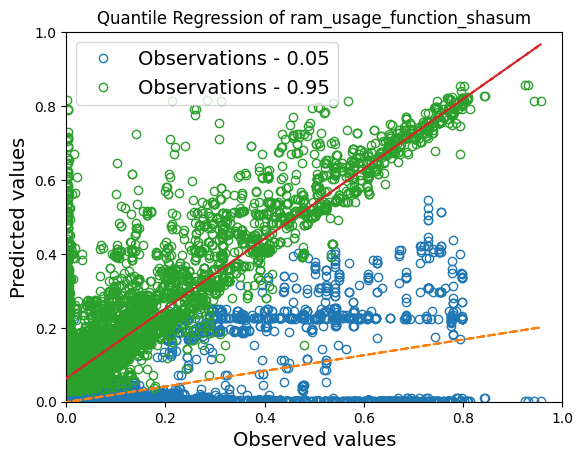

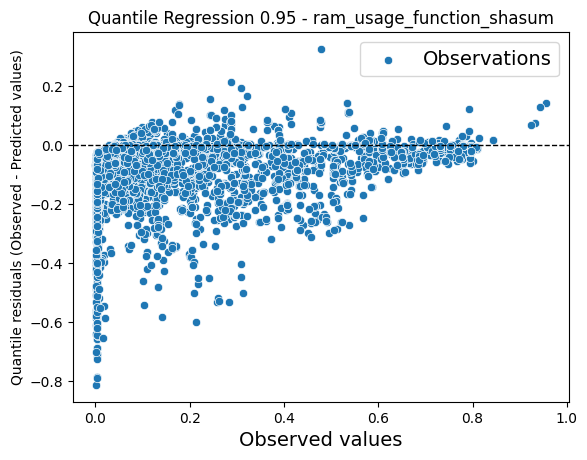

mape: 5.440266900732869
mse: 560970699003210.6
rmse: 23684820.012050137
R-squared score: 0.47584577121381866
Standard deviation: 36140186.17413691
Quantile loss with library:  896910.6735658323
------------------------------
Target: power_usage_function_shasum
mape: 152994139033.42233
mse: 0.0012356920575496966
rmse: 0.03515241183119156
R-squared score: 0.9471066012617739
Standard deviation: 0.14855110980871908


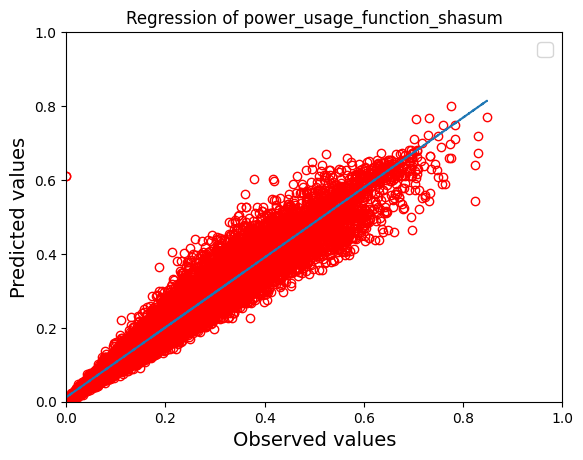

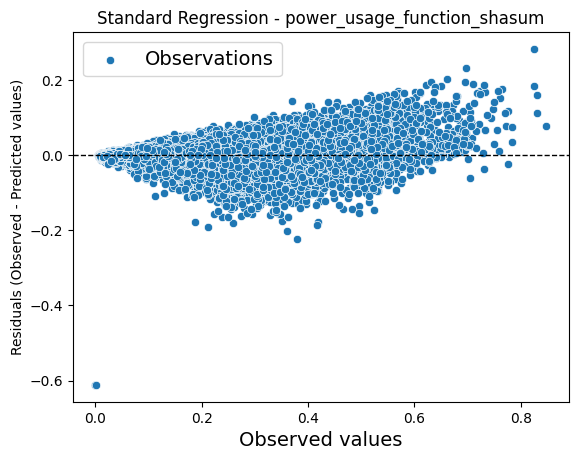

mape: 0.18382046950735395
mse: 8418908.711588454
rmse: 2901.5355782048327
R-squared score: 0.9471066012617739
Standard deviation: 12261.643165814061
------------------------------
Target: power_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.132477920346609 % of cases and less or equal in 94.86752207965338 % of cases.
mape: 104959624431.19588
mse: 0.0052200053116317
rmse: 0.07224960423166137
R-squared score: 0.7765593614712627
Standard deviation: 0.11293847095923791
Quantile loss with library:  0.002993623847091852
Prediction for alpha 0.95 are greater than true values in 94.7564294839749 % of cases and less or equal in 5.243570516025107 % of cases.
mape: 179078243811.57794
mse: 0.005089455748417472
rmse: 0.07134042156041322
R-squared score: 0.782147493287764
Standard deviation: 0.1777676398639279
Quantile loss with library:  0.0032306948336816733


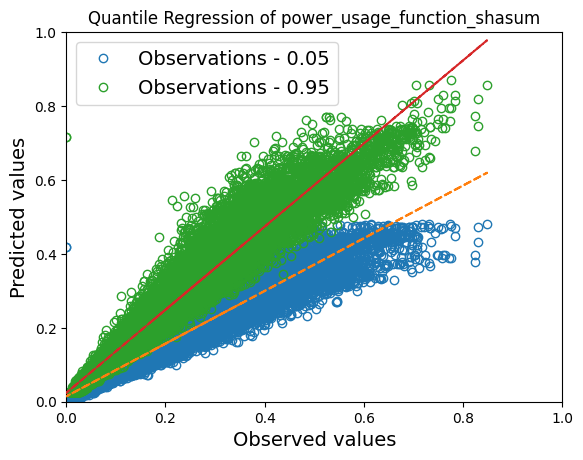

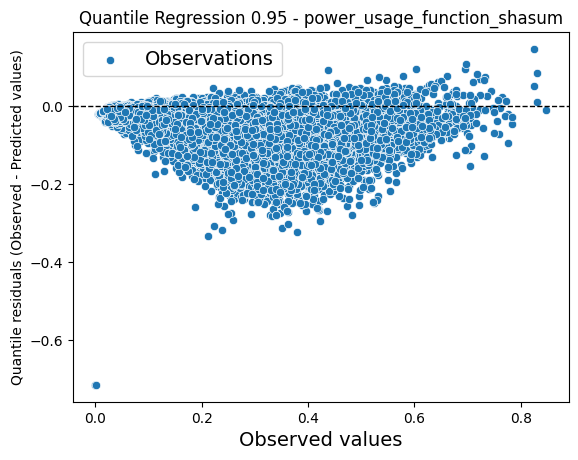

mape: 0.38610022631147045
mse: 34675033.37567786
rmse: 5888.551042122151
R-squared score: 0.7821474932877641
Standard deviation: 14673.221689471953
Quantile loss with library:  266.66665283922765
------------------------------
Target: medium_latency_function_shasum
mape: 2.2461295889039
mse: 0.0002885287770877445
rmse: 0.016986134848391628
R-squared score: 0.8426600198859782
Standard deviation: 0.036920310361199284


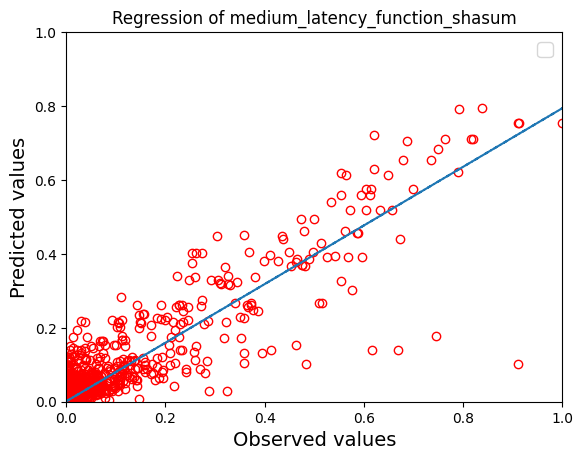

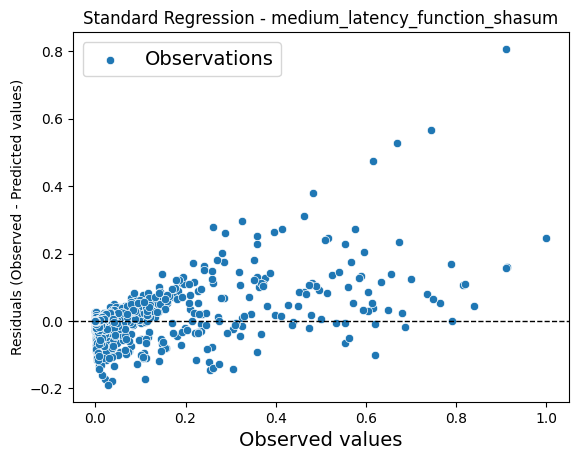

mape: 1.1156992509482533
mse: 1.6864525864002006e+17
rmse: 410664411.2167745
R-squared score: 0.8426600198859782
Standard deviation: 892601975.1843731
------------------------------
Target: medium_latency_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 5.382436260623229 % of cases and less or equal in 94.61756373937678 % of cases.
mape: 0.4352252518769352
mse: 0.001846850265796958
rmse: 0.042974995820790465
R-squared score: -0.007120977765417313
Standard deviation: 0.0004148086577535798
Quantile loss with library:  0.00028244345556367885
Prediction for alpha 0.95 are greater than true values in 95.61739710048325 % of cases and less or equal in 4.382602899516748 % of cases.
mape: 3.7780252643946572
mse: 0.0007352008378556973
rmse: 0.02711458717841187
R-squared score: 0.5990816362388378
Standard deviation: 0.05160309203025223
Quantile loss with library:  0.000709992761438515


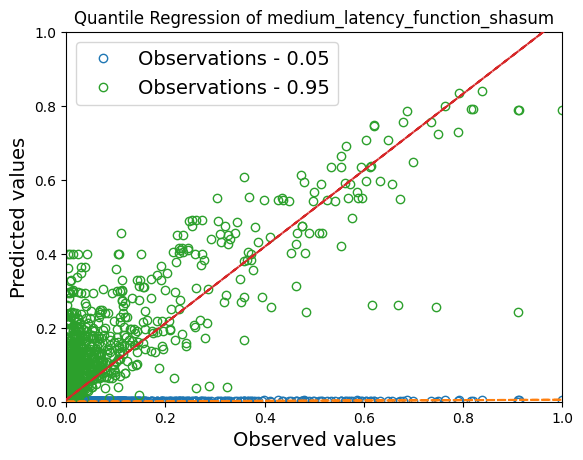

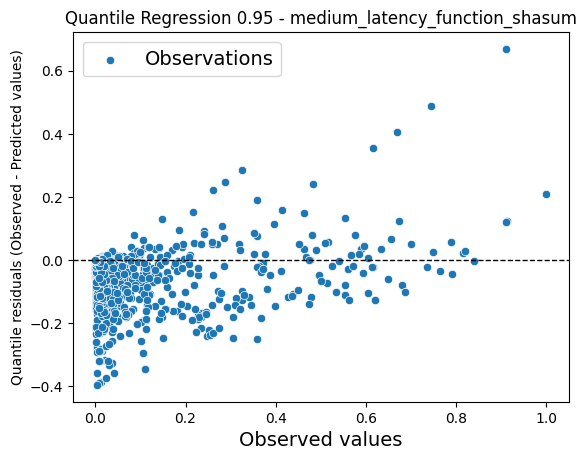

mape: 2.3112652319038895
mse: 4.2972536987126054e+17
rmse: 655534415.4743216
R-squared score: 0.5990816362388378
Standard deviation: 1247579487.3119783
Quantile loss with library:  17165103.300232388
------------------------------
Target: cpu_usage_function_curl
mape: 0.06946454095801578
mse: 0.00047960339652662186
rmse: 0.021899849235248674
R-squared score: 0.987164573338031
Standard deviation: 0.19133340074326669


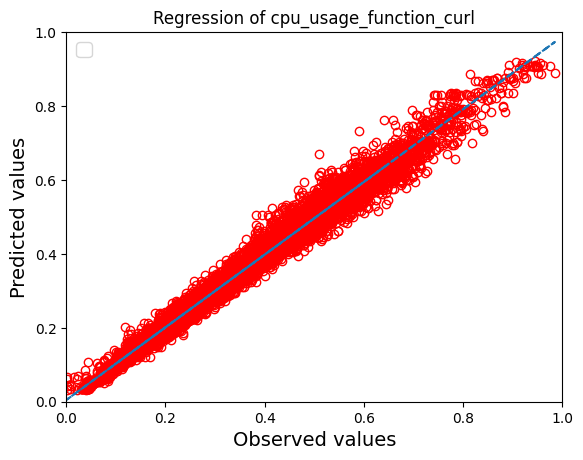

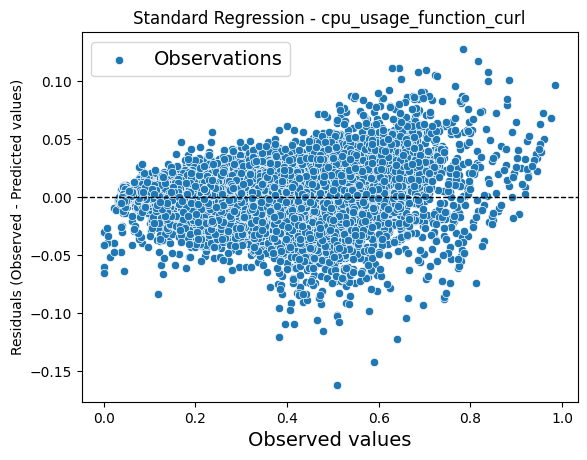

mape: 0.06702317761675287
mse: 8.018740698223382
rmse: 2.831738105514594
R-squared score: 0.987164573338031
Standard deviation: 24.740174049707356
------------------------------
Target: cpu_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 4.7027590784109226 % of cases and less or equal in 95.29724092158908 % of cases.
mape: 0.12498369802489011
mse: 0.004367296056264764
rmse: 0.06608552077622423
R-squared score: 0.8831198681092294
Standard deviation: 0.1559432156632489
Quantile loss with library:  0.0024230134232083706
Prediction for alpha 0.95 are greater than true values in 94.9179861572011 % of cases and less or equal in 5.0820138427989 % of cases.
mape: 0.23399857399413304
mse: 0.002207053597917102
rmse: 0.0469792890316265
R-squared score: 0.9409335405039663
Standard deviation: 0.20302859984780322
Quantile loss with library:  0.002176520496353418


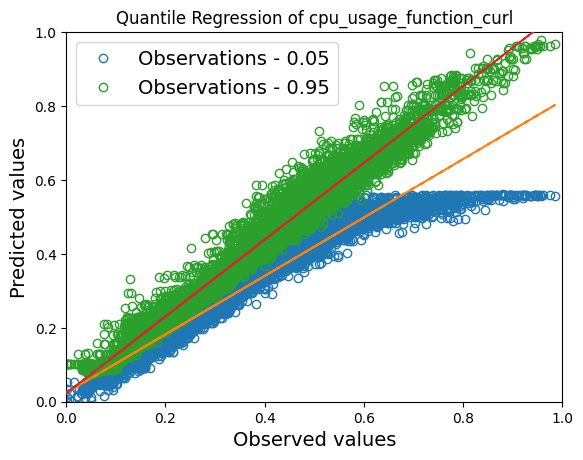

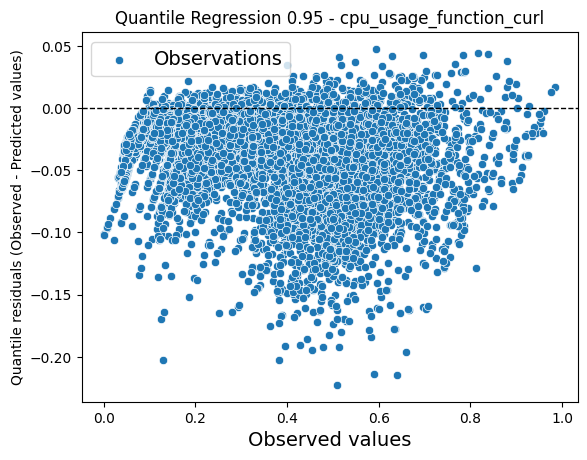

mape: 0.22845778176224618
mse: 36.90088651779563
rmse: 6.074609988945433
R-squared score: 0.9409335405039663
Standard deviation: 26.252410074720345
Quantile loss with library:  0.2814328062604823
------------------------------
Target: ram_usage_function_curl
mape: 17.194049801751124
mse: 0.026891670913950963
rmse: 0.16398680103578753
R-squared score: 0.6422660183625992
Standard deviation: 0.2103428262338016


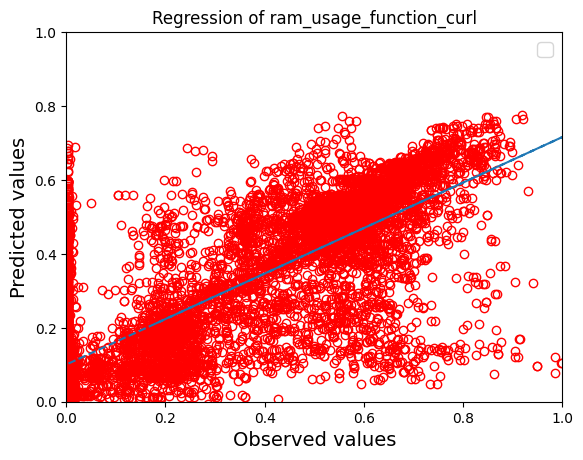

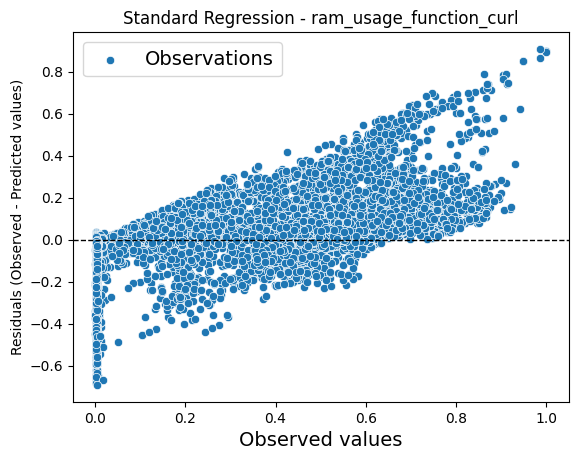

mape: 8.000824045466812
mse: 2241413264582198.0
rmse: 47343566.24275571
R-squared score: 0.6422660183625993
Standard deviation: 60726713.763476506
------------------------------
Target: ram_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.356973546980184 % of cases and less or equal in 94.64302645301981 % of cases.
mape: 0.8657709556334958
mse: 0.09492737334389477
rmse: 0.30810286162886374
R-squared score: -0.2627979622892933
Standard deviation: 0.11984678139074095
Quantile loss with library:  0.0113739945766414
Prediction for alpha 0.95 are greater than true values in 94.57665686925192 % of cases and less or equal in 5.42334313074808 % of cases.
mape: 65.68972070730474
mse: 0.11183084086227929
rmse: 0.3344111853127513
R-squared score: -0.4876610716951544
Standard deviation: 0.1986186718630799
Quantile loss with library:  0.014468594837663797


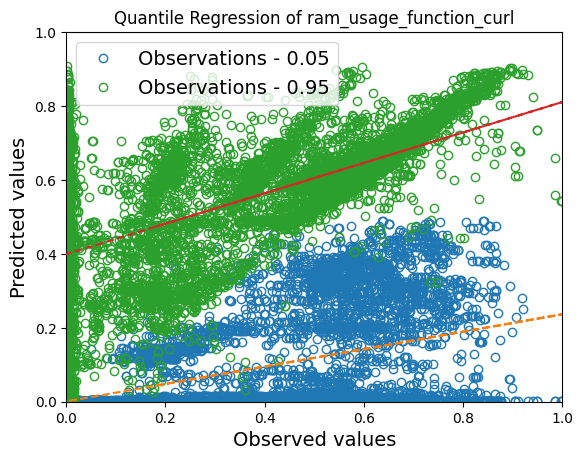

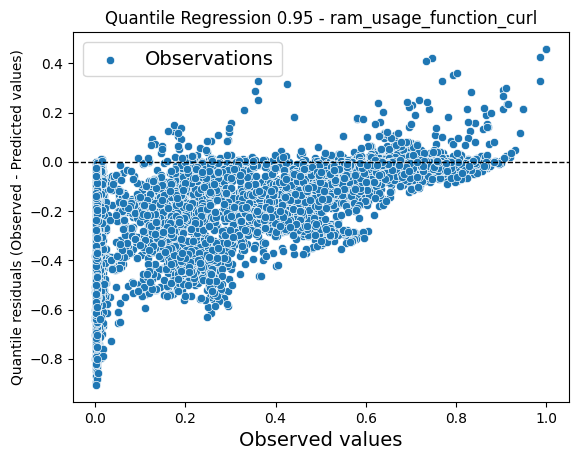

mape: 30.663519061000326
mse: 9321069371262308.0
rmse: 96545685.40987374
R-squared score: -0.4876610716951548
Standard deviation: 57341909.159785114
Quantile loss with library:  4177134.219400012
------------------------------
Target: power_usage_function_curl
mape: 0.121273602855454
mse: 0.0012065667244502492
rmse: 0.0347356693393153
R-squared score: 0.9521736204782033
Standard deviation: 0.1542885292359415


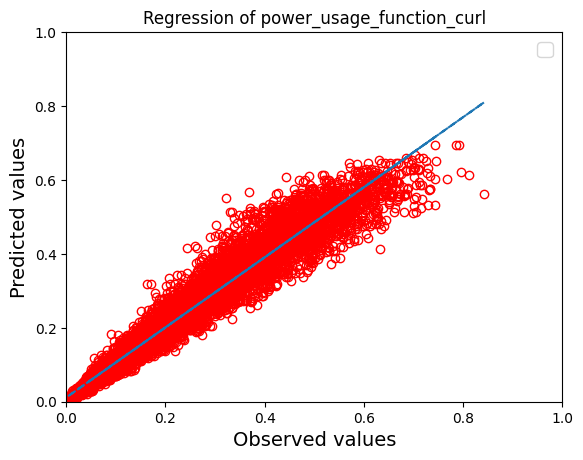

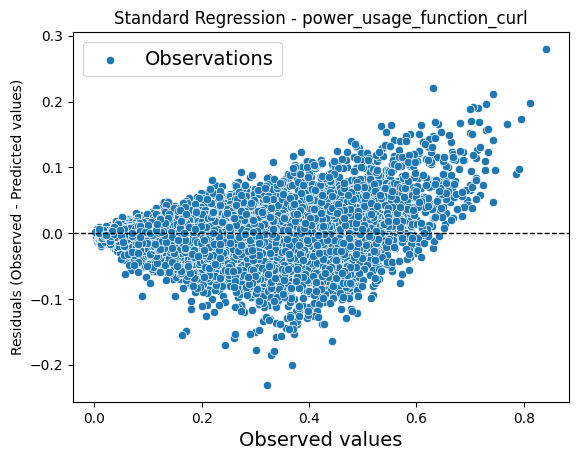

mape: 0.10869322014476374
mse: 19949059.43236591
rmse: 4466.4369952307525
R-squared score: 0.9521736204782033
Standard deviation: 19838.972676400255
------------------------------
Target: power_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.669858727600265 % of cases and less or equal in 94.33014127239974 % of cases.
mape: 0.21532556140688727
mse: 0.004855456459934414
rmse: 0.06968110547296458
R-squared score: 0.8075374542504566
Standard deviation: 0.12183785346195629
Quantile loss with library:  0.0029811152654467803
Prediction for alpha 0.95 are greater than true values in 94.69043329856831 % of cases and less or equal in 5.309566701431686 % of cases.
mape: 0.3122410998354808
mse: 0.0046823936138944994
rmse: 0.06842801775511621
R-squared score: 0.8143973892943295
Standard deviation: 0.18378764951575757
Quantile loss with library:  0.0032549101894645232


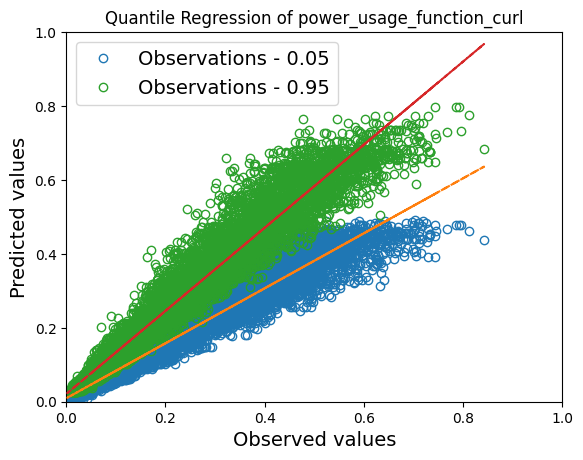

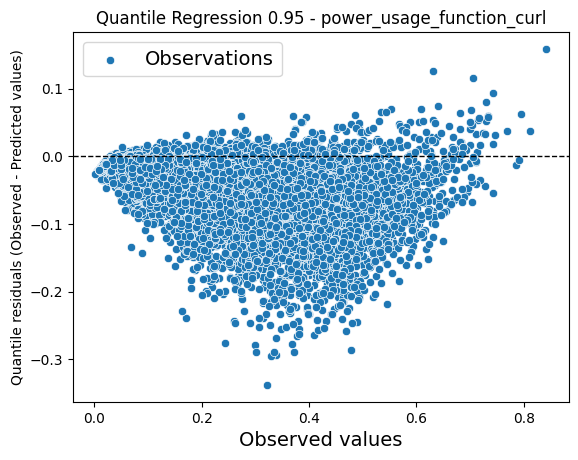

mape: 0.26947535285441987
mse: 77417474.38946839
rmse: 8798.720042680548
R-squared score: 0.8143973892943295
Standard deviation: 23632.07540482257
Quantile loss with library:  418.52803077910824
------------------------------
Target: medium_latency_function_curl
mape: 803938856.0413506
mse: 0.0007325378926553874
rmse: 0.027065437233774508
R-squared score: 0.9860744686178282
Standard deviation: 0.22478104221907905


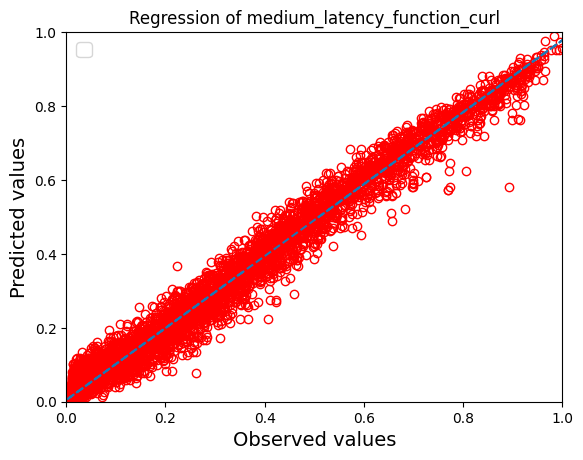

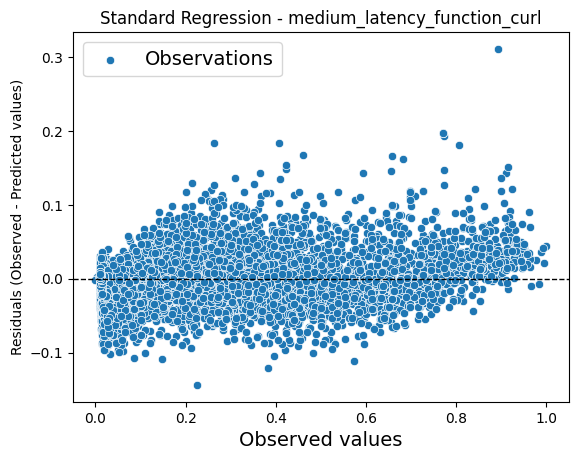

mape: 0.3153294524123595
mse: 5.724684894024336e+17
rmse: 756616474.4455632
R-squared score: 0.9860744686178282
Standard deviation: 6283772111.900989
------------------------------
Target: medium_latency_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 5.3190480705413865 % of cases and less or equal in 94.68095192945862 % of cases.
mape: 990729413.3474516
mse: 0.023015561017267344
rmse: 0.1517088033611344
R-squared score: 0.5624746235823435
Standard deviation: 0.11980345127579443
Quantile loss with library:  0.003999832066602355
Prediction for alpha 0.95 are greater than true values in 95.62908884042855 % of cases and less or equal in 4.370911159571443 % of cases.
mape: 7000562262.008459
mse: 0.016033199392097002
rmse: 0.12662227052180436
R-squared score: 0.6952091850403448
Standard deviation: 0.24765499635589308
Quantile loss with library:  0.0044944841615208245


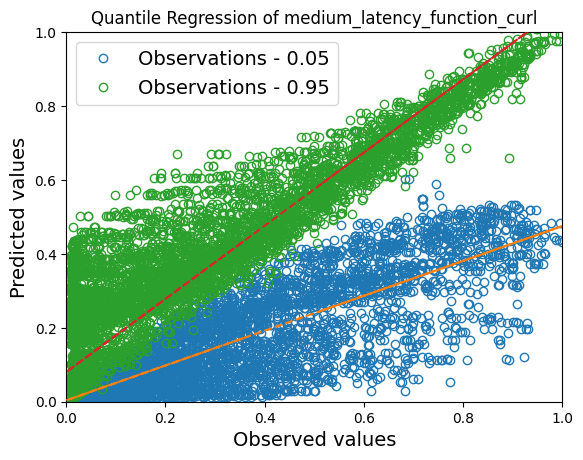

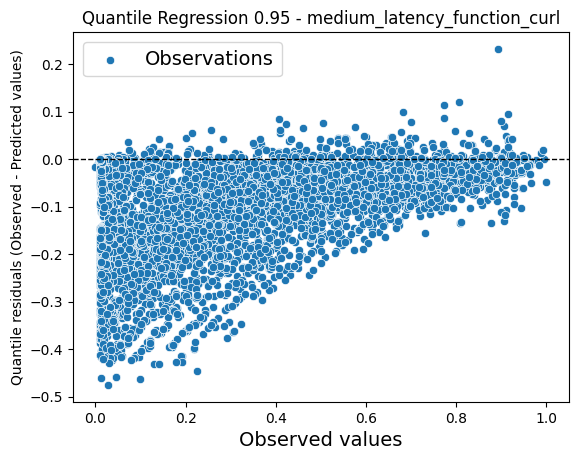

mape: 2.256547835985364
mse: 1.2529729217161042e+19
rmse: 3539735755.273413
R-squared score: 0.6952091850403449
Standard deviation: 6923215339.296144
Quantile loss with library:  125643666.17723644
------------------------------
Target: cpu_usage_function_eat-memory
mape: 0.06296351246950511
mse: 0.000289776061331996
rmse: 0.017022810030426706
R-squared score: 0.988514517562045
Standard deviation: 0.15811119882722655


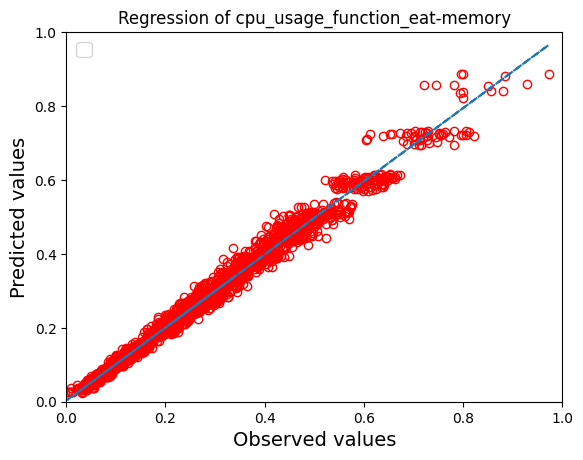

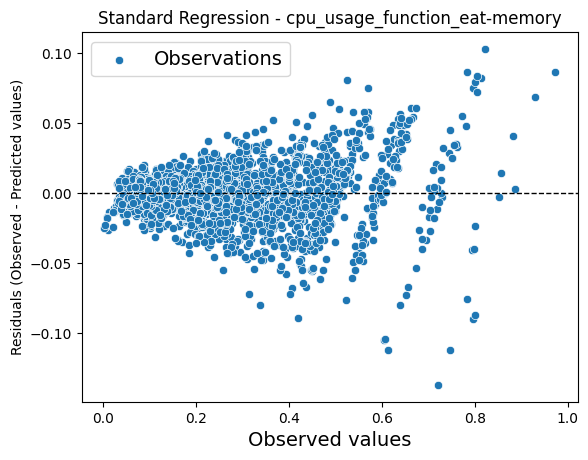

mape: 0.05079547817037176
mse: 27.18670024358886
rmse: 5.2140867123197
R-squared score: 0.988514517562045
Standard deviation: 48.42946020077949
------------------------------
Target: cpu_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 6.090487238979119 % of cases and less or equal in 93.90951276102089 % of cases.
mape: 0.11174682302625212
mse: 0.0016354393629783555
rmse: 0.04044056580932512
R-squared score: 0.9351781855427056
Standard deviation: 0.1355879614804711
Quantile loss with library:  0.0016241289554518755
Prediction for alpha 0.95 are greater than true values in 94.63457076566125 % of cases and less or equal in 5.365429234338747 % of cases.
mape: 0.19141719562965212
mse: 0.0012535800355648538
rmse: 0.03540593220866884
R-squared score: 0.9503134544072798
Standard deviation: 0.16895953532545338
Quantile loss with library:  0.0016127390825078226


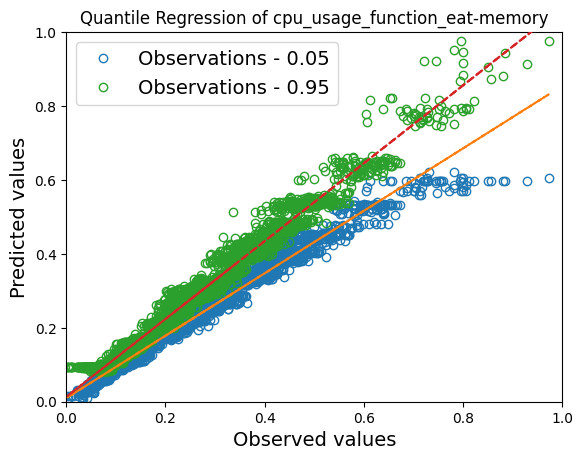

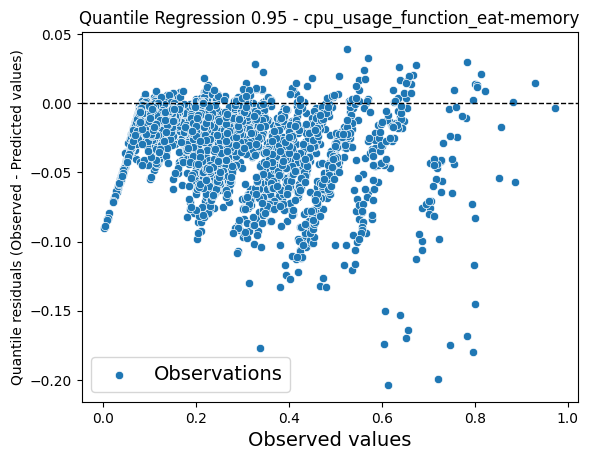

mape: 0.14499471343428422
mse: 117.61049032688354
rmse: 10.844837035515265
R-squared score: 0.9503134544072798
Standard deviation: 51.752305670186374
Quantile loss with library:  0.49398198097214596
------------------------------
Target: ram_usage_function_eat-memory
mape: 520420984748.78735
mse: 0.008148347447482652
rmse: 0.09026819732044421
R-squared score: 0.7429796242547908
Standard deviation: 0.15210488050916354


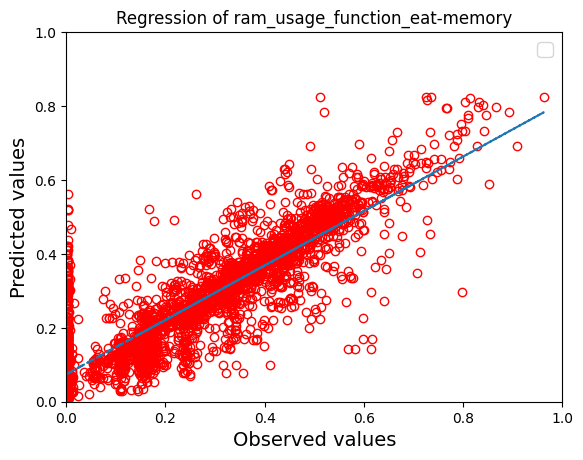

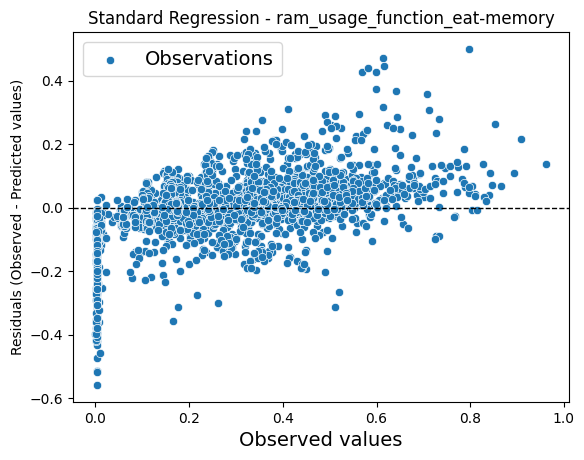

mape: 2.6723735645000244
mse: 841885812166583.2
rmse: 29015268.60407436
R-squared score: 0.7429796242547908
Standard deviation: 48891681.62178933
------------------------------
Target: ram_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 7.018561484918793 % of cases and less or equal in 92.98143851508121 % of cases.
mape: 93548301948.99373
mse: 0.03261850027299806
rmse: 0.1806059253540649
R-squared score: -0.028873553864128043
Standard deviation: 0.1271078699071122
Quantile loss with library:  0.008529016669653262
Prediction for alpha 0.95 are greater than true values in 93.59048723897911 % of cases and less or equal in 6.409512761020881 % of cases.
mape: 627631125748.2089
mse: 0.024711019508932303
rmse: 0.15719739027392376
R-squared score: 0.22054925122331093
Standard deviation: 0.15854323664743322
Quantile loss with library:  0.005686126322640239


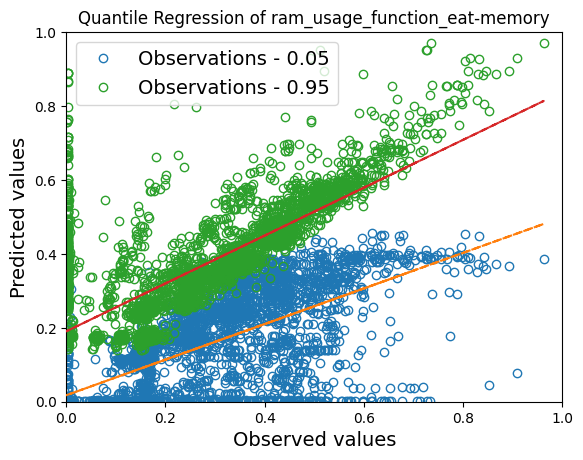

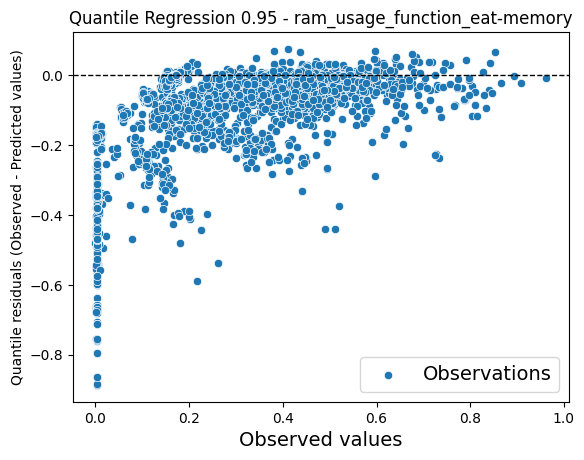

mape: 6.148545848446114
mse: 2553138150137289.0
rmse: 50528587.45440336
R-squared score: 0.22054925122331082
Standard deviation: 50961188.25054613
Quantile loss with library:  1827714.3829783557
------------------------------
Target: power_usage_function_eat-memory
mape: 0.12681814604608882
mse: 0.0006148740357956356
rmse: 0.024796653721735028
R-squared score: 0.9586655327671957
Standard deviation: 0.11869710866977977


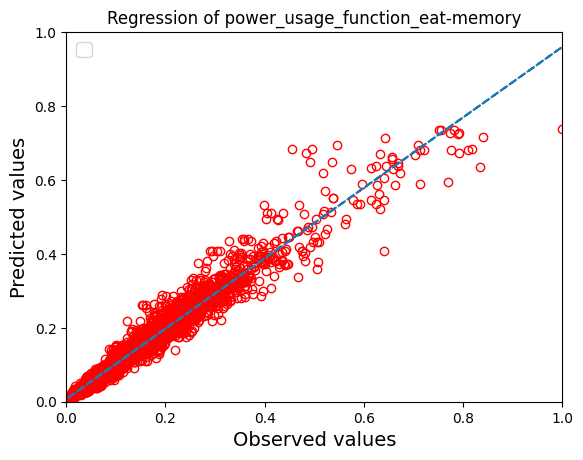

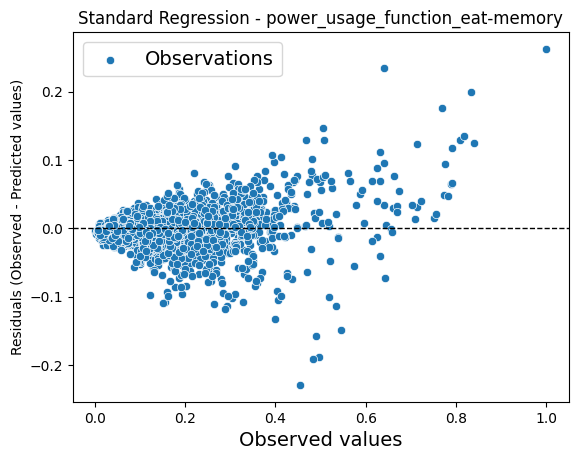

mape: 0.10018130828708578
mse: 2068131.3753927515
rmse: 1438.0999184315224
R-squared score: 0.9586655327671957
Standard deviation: 6883.924912273366
------------------------------
Target: power_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 5.8294663573085845 % of cases and less or equal in 94.17053364269141 % of cases.
mape: 0.2159069047744949
mse: 0.002773775817951009
rmse: 0.05266664806071304
R-squared score: 0.8135349047388502
Standard deviation: 0.08876394358892671
Quantile loss with library:  0.001946334169545889
Prediction for alpha 0.95 are greater than true values in 94.08352668213456 % of cases and less or equal in 5.916473317865429 % of cases.
mape: 0.3215093764175737
mse: 0.0022750666881490396
rmse: 0.0476976591474785
R-squared score: 0.8470602692597733
Standard deviation: 0.14061800254770576
Quantile loss with library:  0.0021723011346893918


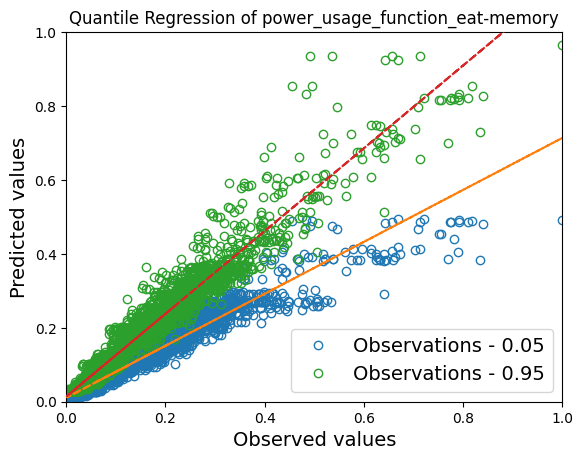

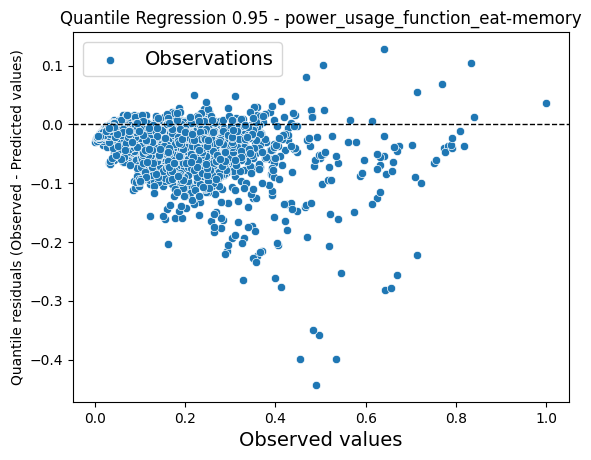

mape: 0.24350261876669965
mse: 7652196.262903743
rmse: 2766.260338960117
R-squared score: 0.8470602692597733
Standard deviation: 8155.24305267871
Quantile loss with library:  125.98417994873431
------------------------------
Target: medium_latency_function_eat-memory
mape: 14421796876.839663
mse: 0.0013099070667154159
rmse: 0.036192638294484915
R-squared score: 0.9627145924861518
Standard deviation: 0.17883572168246448


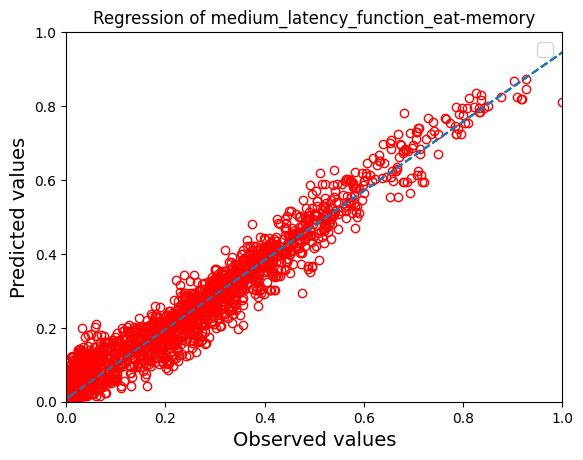

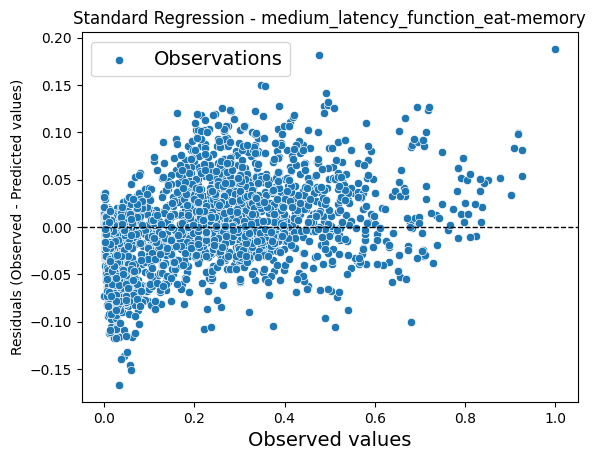

mape: 0.20843243358810595
mse: 9.042954218903442e+17
rmse: 950944489.384288
R-squared score: 0.9627145924861519
Standard deviation: 4698824182.290028
------------------------------
Target: medium_latency_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 5.4234338747099775 % of cases and less or equal in 94.57656612529001 % of cases.
mape: 794567230.4738784
mse: 0.028098440268984292
rmse: 0.1676258937902623
R-squared score: 0.20020143218281372
Standard deviation: 0.07231833744634965
Quantile loss with library:  0.005186040130083907
Prediction for alpha 0.95 are greater than true values in 94.17053364269141 % of cases and less or equal in 5.8294663573085845 % of cases.
mape: 130157477573.11385
mse: 0.016725566866478397
rmse: 0.1293273631776292
R-squared score: 0.5239207479958972
Standard deviation: 0.17878917888423507
Quantile loss with library:  0.005752150156950252


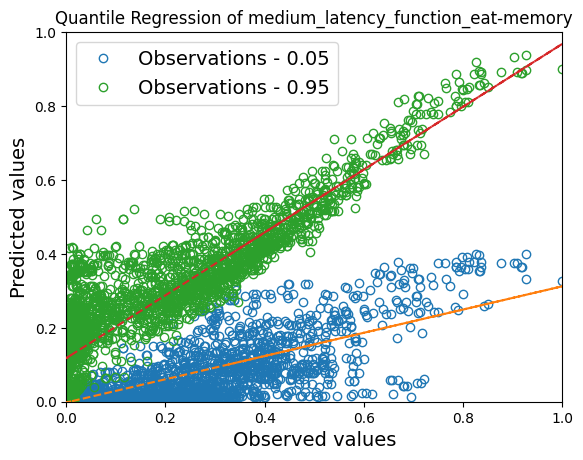

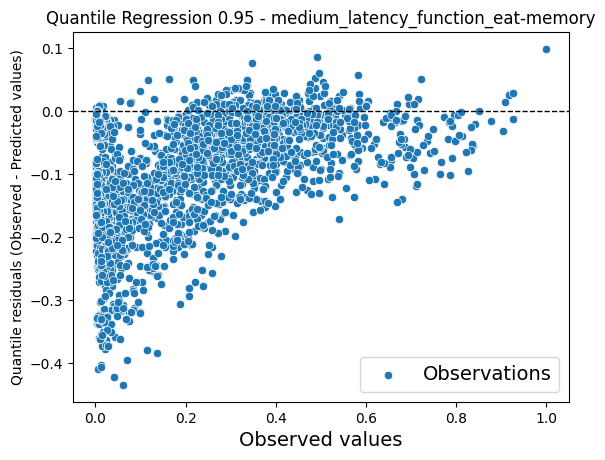

mape: 1.3830299397018992
mse: 1.1546508855626471e+19
rmse: 3398015428.9859357
R-squared score: 0.523920747995897
Standard deviation: 4697601292.233308
Quantile loss with library:  151135030.5373105
------------------------------
Target: cpu_usage_node
mape: 0.06303095758438951
mse: 0.0005661667540633093
rmse: 0.023794258846690505
R-squared score: 0.9837326639258919
Standard deviation: 0.18429628665837897


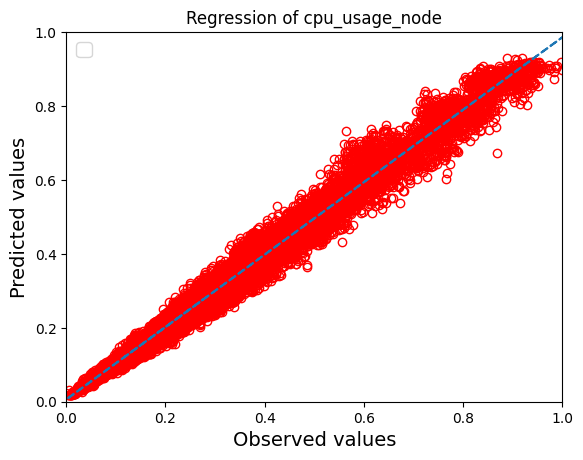

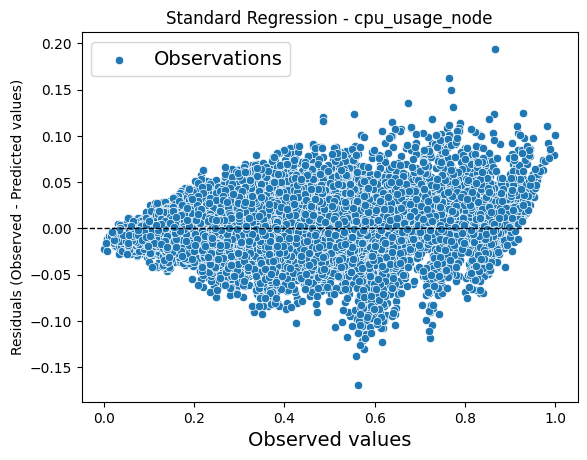

mape: 0.035596753869888864
mse: 96.49677774187843
rmse: 9.823277342205015
R-squared score: 0.9837326639258919
Standard deviation: 76.08530900871403
------------------------------
Target: cpu_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.610460640926953 % of cases and less or equal in 95.38953935907305 % of cases.
mape: 0.15202946601668565
mse: 0.007316889885174678
rmse: 0.08553882092462274
R-squared score: 0.7897681099691183
Standard deviation: 0.13805151441797398
Quantile loss with library:  0.0030145836570614017
Prediction for alpha 0.95 are greater than true values in 95.25179273183973 % of cases and less or equal in 4.7482072681602725 % of cases.
mape: 0.24048917272617362
mse: 0.0032912410350576554
rmse: 0.05736933880617464
R-squared score: 0.9054347087074076
Standard deviation: 0.19377488765946604
Quantile loss with library:  0.0028306544561094603


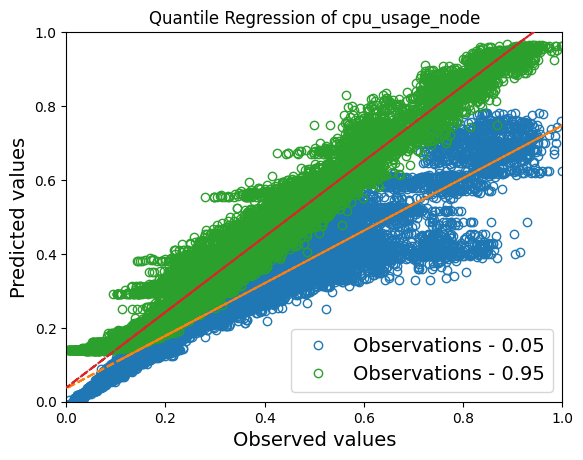

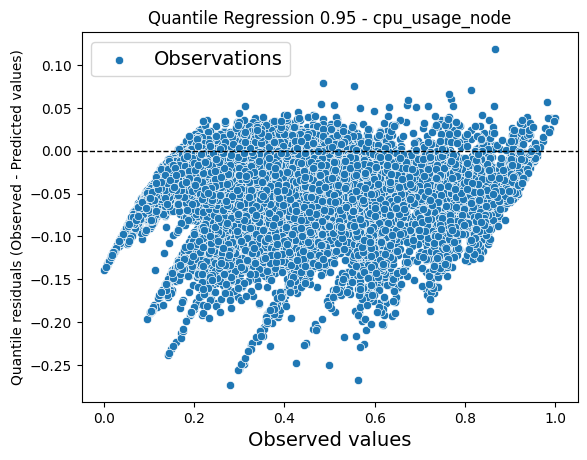

mape: 0.11085134650004462
mse: 560.9551468283405
rmse: 23.684491694531687
R-squared score: 0.9054347087074076
Standard deviation: 79.99847676273849
Quantile loss with library:  1.1686139905206272
------------------------------
Target: ram_usage_node
mape: 31086466659.122715
mse: 0.0008662674530356498
rmse: 0.02943242180038282
R-squared score: 0.9514725470383444
Standard deviation: 0.12715617754865166


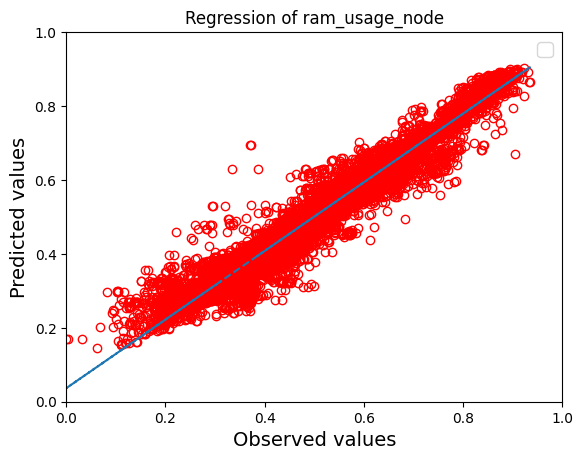

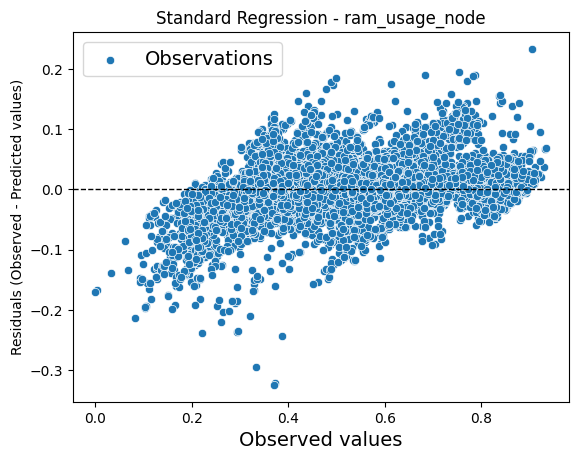

mape: 0.015413835921174523
mse: 9486738394178568.0
rmse: 97399889.08709583
R-squared score: 0.9514725470383444
Standard deviation: 420794376.8261927
------------------------------
Target: ram_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.732001782603412 % of cases and less or equal in 95.26799821739658 % of cases.
mape: 30113735948.505207
mse: 0.005667616160936135
rmse: 0.07528357165368907
R-squared score: 0.682505702262337
Standard deviation: 0.11999741370263073
Quantile loss with library:  0.003155777839035126
Prediction for alpha 0.95 are greater than true values in 95.51513187213871 % of cases and less or equal in 4.484868127861281 % of cases.
mape: 78128960213.72717
mse: 0.006126783584322852
rmse: 0.07827377328532752
R-squared score: 0.6567835936204387
Standard deviation: 0.11298275762651334
Quantile loss with library:  0.0033413308882080978


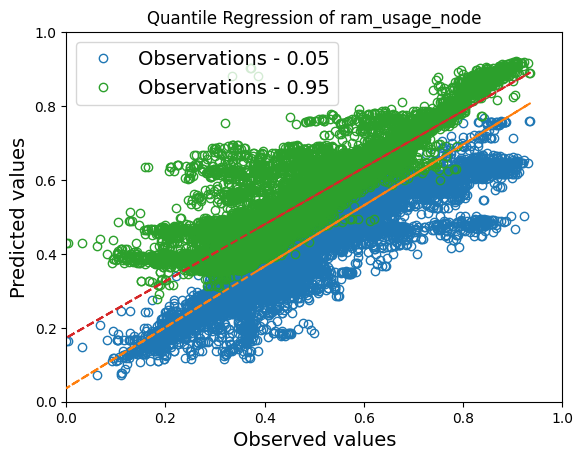

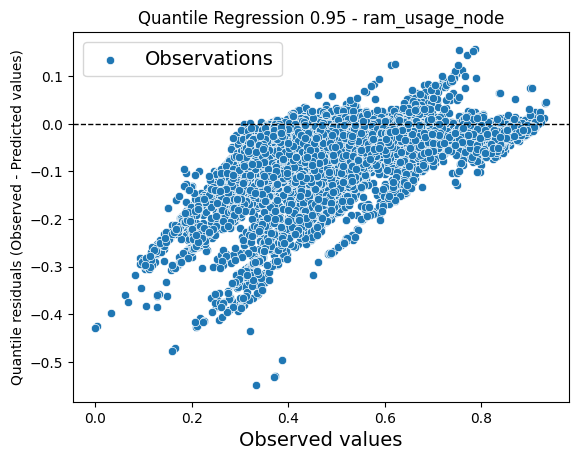

mape: 0.04502562310917336
mse: 6.709612932880975e+16
rmse: 259029205.55182528
R-squared score: 0.6567835936204387
Standard deviation: 373890675.26320577
Quantile loss with library:  11057372.720532402
------------------------------
Target: ram_usage_node_percentage
mape: 0.047484793271782705
mse: 0.00033471668340370134
rmse: 0.01829526396102831
R-squared score: 0.9931064131479528
Standard deviation: 0.2185323361056862


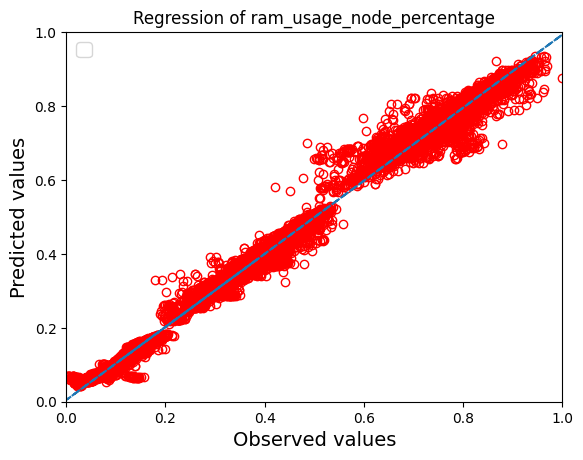

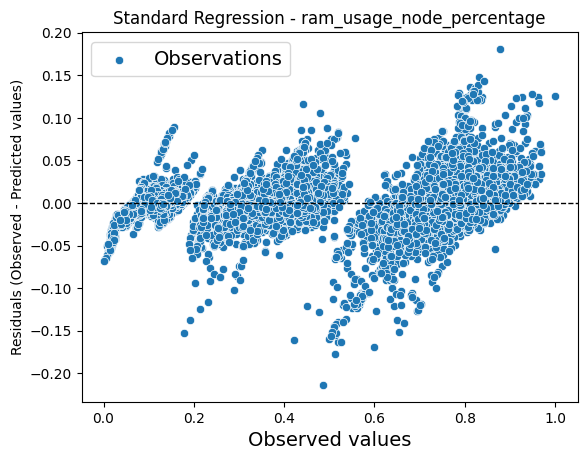

mape: 0.01636447438668119
mse: 0.6474814162912597
rmse: 0.8046622995339472
R-squared score: 0.9931064131479528
Standard deviation: 9.61148920660029
------------------------------
Target: ram_usage_node_percentage quantiles
Prediction for alpha 0.05 are greater than true values in 4.22152898756229 % of cases and less or equal in 95.7784710124377 % of cases.
mape: 0.0838258302898885
mse: 0.003997889038621925
rmse: 0.06322886238595413
R-squared score: 0.9176623195702853
Standard deviation: 0.1884023296388754
Quantile loss with library:  0.002081622331105962
Prediction for alpha 0.95 are greater than true values in 95.3490256451809 % of cases and less or equal in 4.650974354819106 % of cases.
mape: 0.1885367317532223
mse: 0.0025635378481627127
rmse: 0.050631391924010075
R-squared score: 0.947203196969104
Standard deviation: 0.2223402934841113
Quantile loss with library:  0.001993619697579254


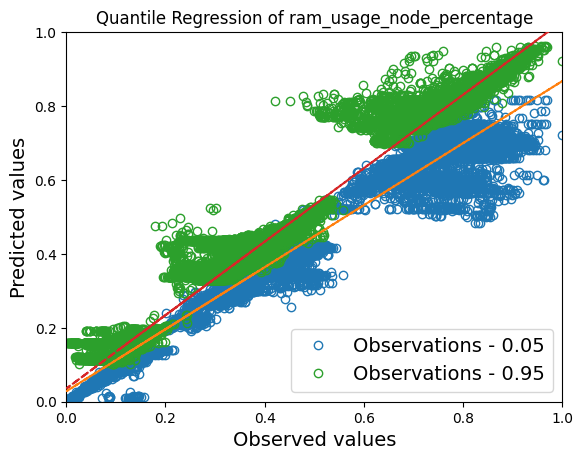

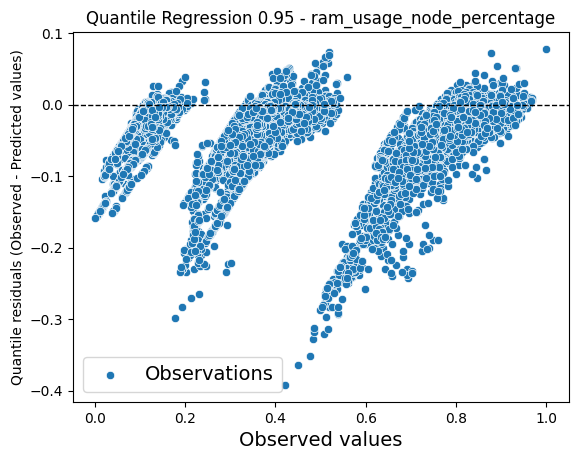

mape: 0.0586315340542205
mse: 4.958949460677784
rmse: 2.226869879601811
R-squared score: 0.947203196969104
Standard deviation: 9.778970788018183
Quantile loss with library:  0.08768338153893075
------------------------------
Target: power_usage_node
mape: 0.12040863699494316
mse: 0.0009671513396138154
rmse: 0.031099056892674663
R-squared score: 0.954951213117061
Standard deviation: 0.14230853695310053


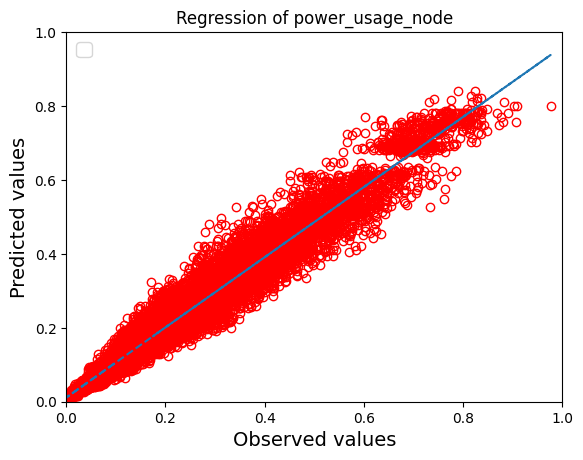

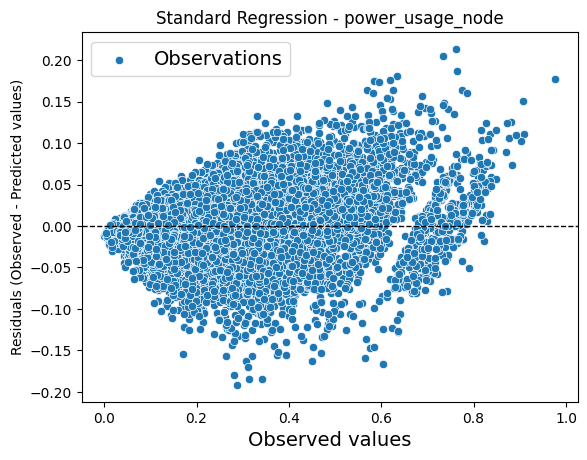

mape: 0.08861314366073327
mse: 15222091695.37155
rmse: 123377.84118459663
R-squared score: 0.954951213117061
Standard deviation: 564574.03618396
------------------------------
Target: power_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 5.120933435968075 % of cases and less or equal in 94.87906656403192 % of cases.
mape: 0.21971297649812777
mse: 0.00483297975904038
rmse: 0.06951963578040653
R-squared score: 0.77488541218223
Standard deviation: 0.11284668739538867
Quantile loss with library:  0.0030228764456551216
Prediction for alpha 0.95 are greater than true values in 95.11404610460642 % of cases and less or equal in 4.885953895393591 % of cases.
mape: 0.34345870010385554
mse: 0.004169757766369136
rmse: 0.06457366155305998
R-squared score: 0.8057775228376887
Standard deviation: 0.15923522074161733
Quantile loss with library:  0.0031774618678048865


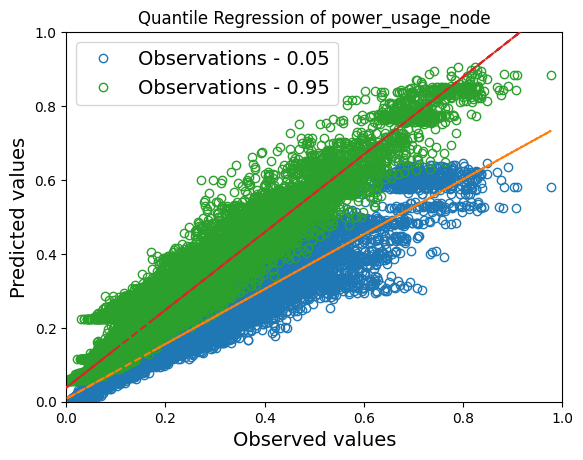

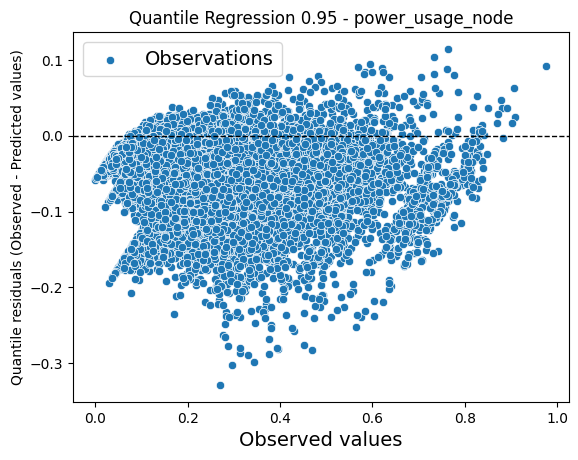

mape: 0.2317204741827587
mse: 65628234659.224335
rmse: 256180.0824795408
R-squared score: 0.8057775228376887
Standard deviation: 631726.481077986
Quantile loss with library:  12605.796601776843
------------------------------
Target: overloaded_node
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.98     22576
           1       0.97      1.00      0.98     22794

    accuracy                           0.98     45370
   macro avg       0.98      0.98      0.98     45370
weighted avg       0.98      0.98      0.98     45370

Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.97      0.98     22576
         1.0       0.97      1.00      0.98     22794

    accuracy                           0.98     45370
   macro avg       0.98      0.98      0.98     45370
weighted avg       0.98      0.98      0.98     45370

------------------------------
Target: cpu_usage_

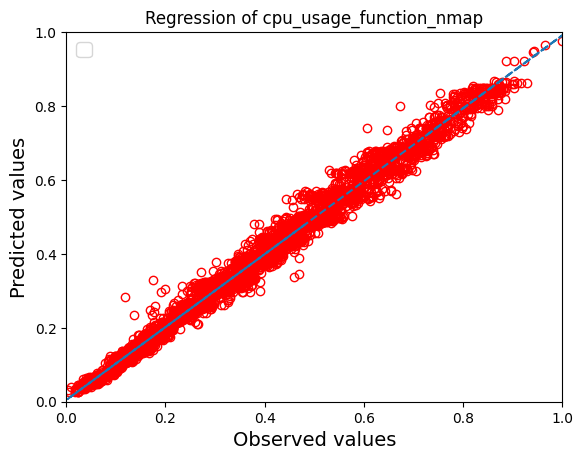

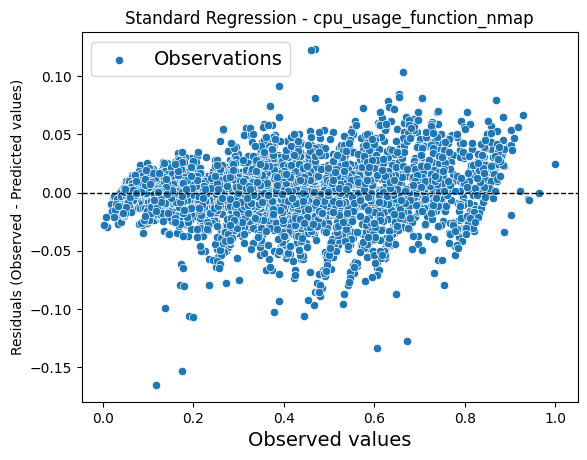

mape: 0.04625042094623701
mse: 60.27591619435777
rmse: 7.763756577479601
R-squared score: 0.9892540861411121
Standard deviation: 74.29795132115694
------------------------------
Target: cpu_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 5.710129114384434 % of cases and less or equal in 94.28987088561557 % of cases.
mape: 0.11741290436587096
mse: 0.0030154339622690913
rmse: 0.054912967159579815
R-squared score: 0.9314508142263812
Standard deviation: 0.18387752418517414
Quantile loss with library:  0.002378499179485594
Prediction for alpha 0.95 are greater than true values in 94.61720312784142 % of cases and less or equal in 5.382796872158574 % of cases.
mape: 0.19986856540523
mse: 0.0022438094505124622
rmse: 0.047368865835192446
R-squared score: 0.9489919816555895
Standard deviation: 0.2151076710745097
Quantile loss with library:  0.0021876079483099348


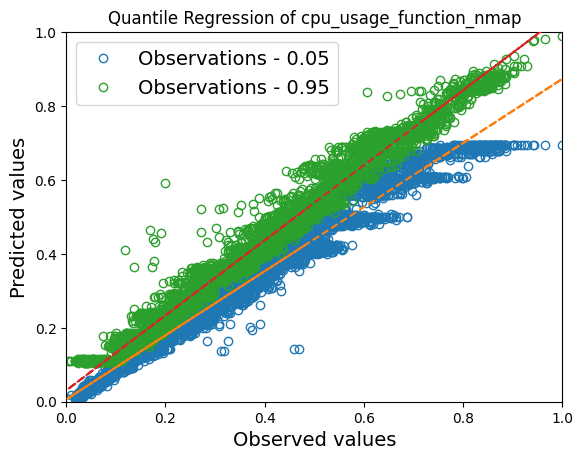

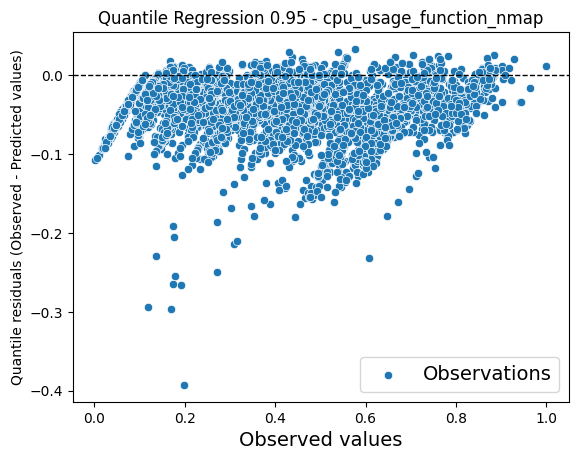

mape: 0.14247503909798764
mse: 286.1138735469197
rmse: 16.914900932223034
R-squared score: 0.9489919816555895
Standard deviation: 76.8125831563256
Quantile loss with library:  0.7811707346540463
------------------------------
Target: ram_usage_function_nmap
mape: 36.524363071347274
mse: 0.03596215681536044
rmse: 0.18963690784064277
R-squared score: 0.5495723388012447
Standard deviation: 0.19719816304585672


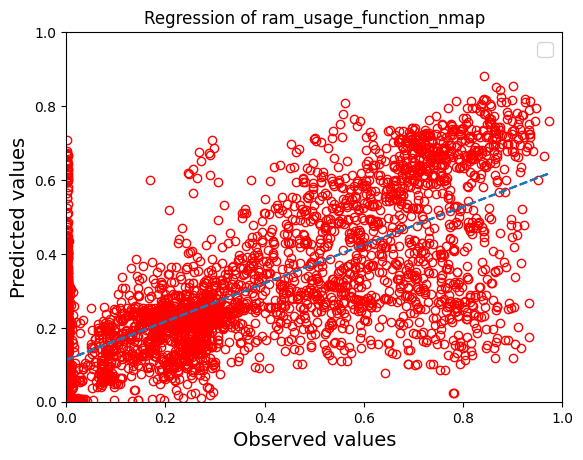

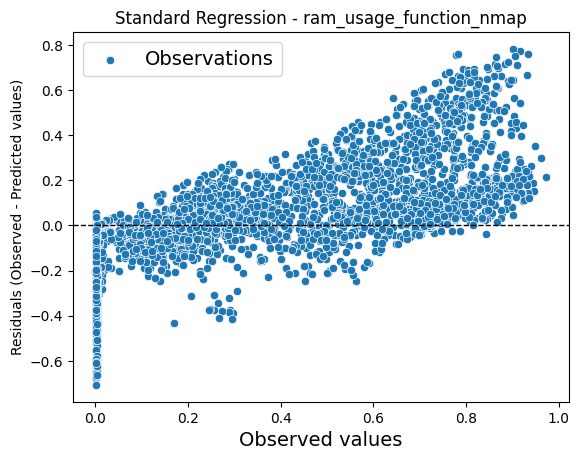

mape: 11.222437118470515
mse: 4025244580092916.5
rmse: 63444815.234130174
R-squared score: 0.5495723388012448
Standard deviation: 65974504.4433427
------------------------------
Target: ram_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 7.055828332424078 % of cases and less or equal in 92.94417166757593 % of cases.
mape: 1.0086359431083793
mse: 0.11339010647190936
rmse: 0.3367344747303272
R-squared score: -0.4202162768892892
Standard deviation: 0.06872131052638661
Quantile loss with library:  0.011088008077691532
Prediction for alpha 0.95 are greater than true values in 93.98072376795781 % of cases and less or equal in 6.0192762320421895 % of cases.
mape: 155.8459676898083
mse: 0.1741481040902677
rmse: 0.4173105607221889
R-squared score: -1.1812129798086048
Standard deviation: 0.2639646554765357
Quantile loss with library:  0.017165277882627096


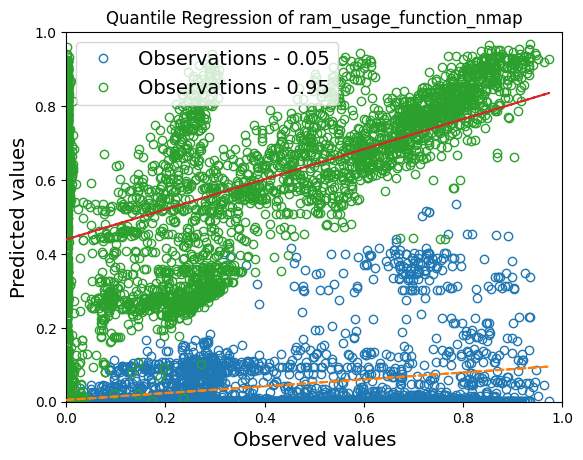

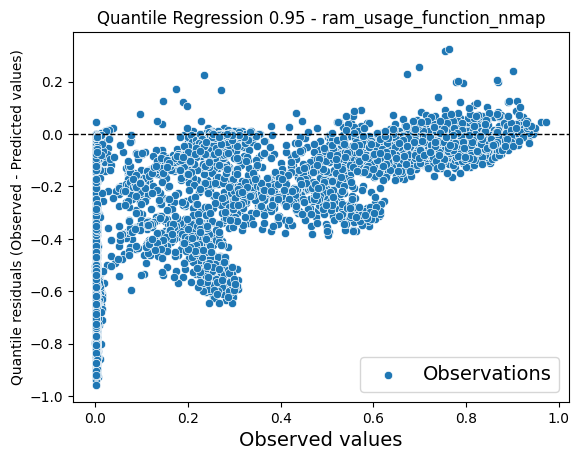

mape: 46.053259717812274
mse: 1.949239907166512e+16
rmse: 139615182.0958778
R-squared score: -1.1812129798086048
Standard deviation: 88311863.89688854
Quantile loss with library:  5742805.533514263
------------------------------
Target: power_usage_function_nmap
mape: 0.722614534603208
mse: 0.0009538139816284064
rmse: 0.03088387899258133
R-squared score: 0.9750685988875414
Standard deviation: 0.1930679539856385


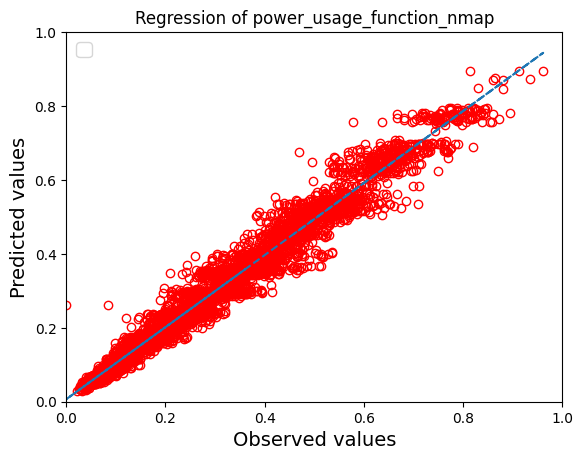

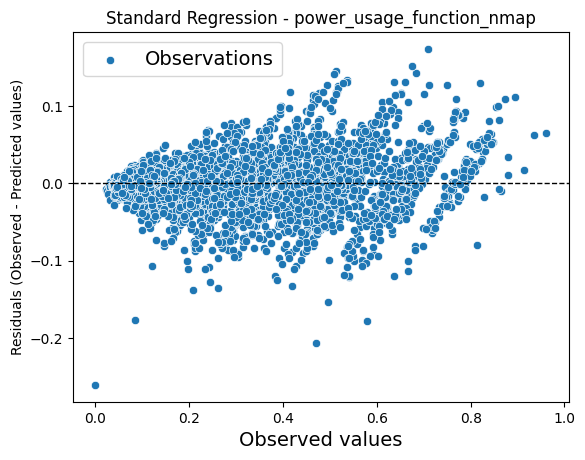

mape: 0.1409559999938015
mse: 3058688.8029388543
rmse: 1748.9107475622804
R-squared score: 0.9750685988875414
Standard deviation: 10933.167424223251
------------------------------
Target: power_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 6.473904346244772 % of cases and less or equal in 93.52609565375522 % of cases.
mape: 0.6664802967500655
mse: 0.0038663964042087535
rmse: 0.062180353844351464
R-squared score: 0.8989376529703146
Standard deviation: 0.16904826929297911
Quantile loss with library:  0.0028921831790011316
Prediction for alpha 0.95 are greater than true values in 94.19894526277504 % of cases and less or equal in 5.80105473722495 % of cases.
mape: 1.1146517704901246
mse: 0.0037212450834208937
rmse: 0.061002008847421525
R-squared score: 0.9027317112146559
Standard deviation: 0.2119273075314333
Quantile loss with library:  0.0030100103519546616


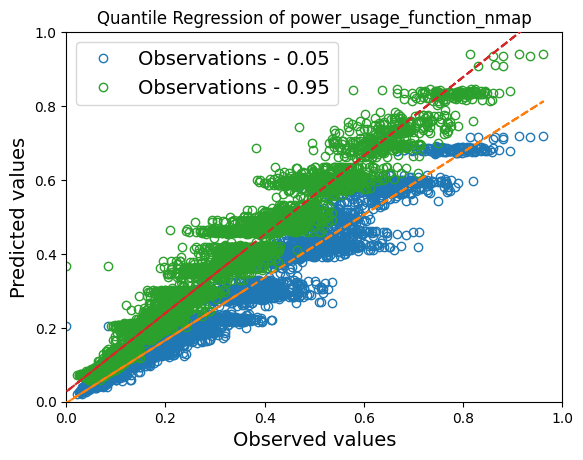

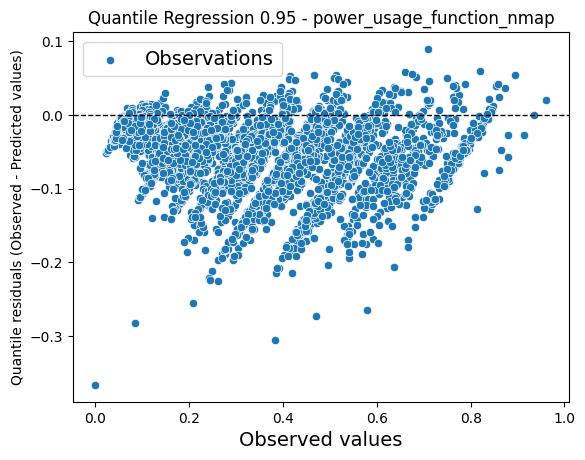

mape: 0.296034565271619
mse: 11933281.424768506
rmse: 3454.458195545071
R-squared score: 0.9027317112146559
Standard deviation: 12001.146162135037
Quantile loss with library:  170.45266419000546
------------------------------
Target: medium_latency_function_nmap
mape: 1.0560509556949884
mse: 0.0007144941014768908
rmse: 0.026730022474305757
R-squared score: 0.9917676693706036
Standard deviation: 0.29178271996289745


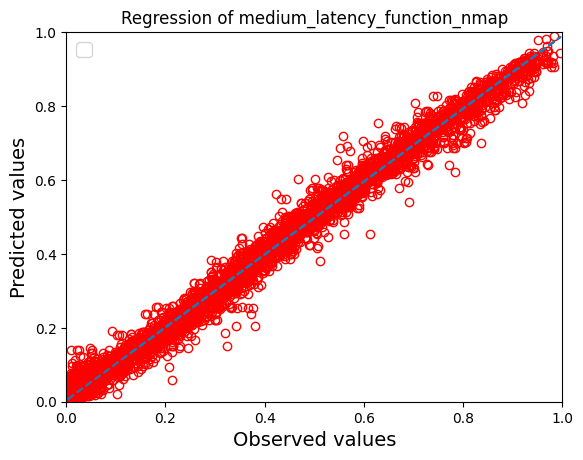

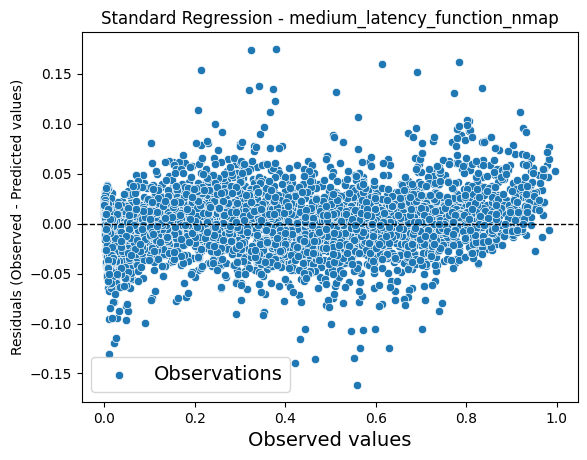

mape: 0.41780204509726365
mse: 6.202179527038767e+17
rmse: 787539175.3455042
R-squared score: 0.9917676693706036
Standard deviation: 8596712661.971552
------------------------------
Target: medium_latency_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 4.909983633387888 % of cases and less or equal in 95.0900163666121 % of cases.
mape: 0.5386806163392268
mse: 0.03134669467963864
rmse: 0.1770499779148211
R-squared score: 0.638826472873445
Standard deviation: 0.20928726232027373
Quantile loss with library:  0.005550331941514397
Prediction for alpha 0.95 are greater than true values in 95.65375522822332 % of cases and less or equal in 4.3462447717766866 % of cases.
mape: 5.486832767136813
mse: 0.022363543537687495
rmse: 0.1495444533832248
R-squared score: 0.7423294551115339
Standard deviation: 0.3036943126296075
Quantile loss with library:  0.004892652453884448


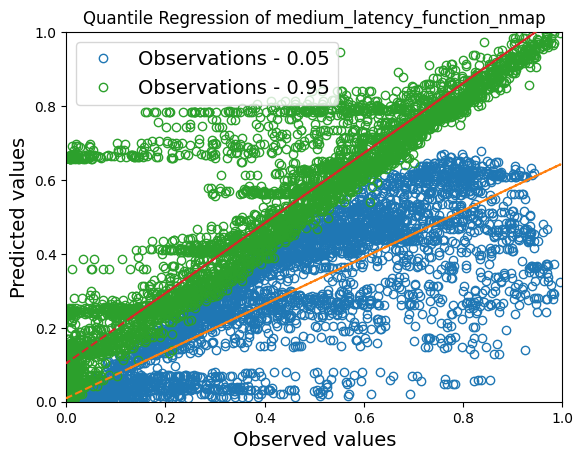

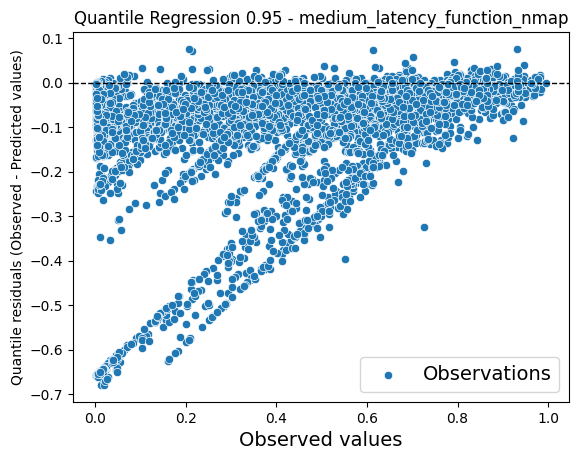

mape: 2.862369567383
mse: 1.9412716157457547e+19
rmse: 4405986400.05363
R-squared score: 0.7423294551115338
Standard deviation: 8947660584.847775
Quantile loss with library:  144150850.69562373
------------------------------
Target: cpu_usage_function_env
mape: 57108317131.8116
mse: 0.0003186690982533599
rmse: 0.017851305225483092
R-squared score: 0.9875755674474429
Standard deviation: 0.15900681558730675


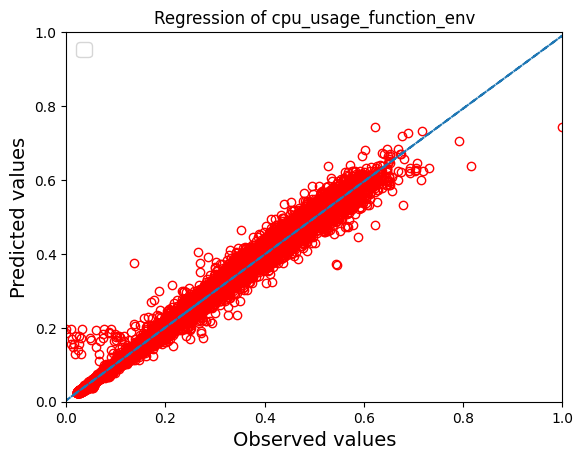

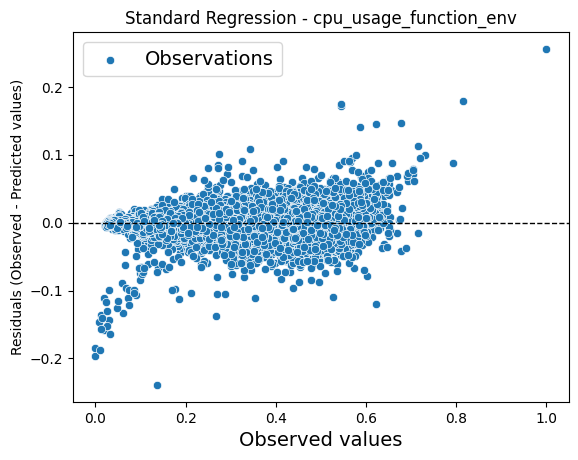

mape: 0.07604323167840547
mse: 0.3363043086098442
rmse: 0.5799175015550438
R-squared score: 0.9875755674474428
Standard deviation: 5.165495411169247
------------------------------
Target: cpu_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 4.755713699192555 % of cases and less or equal in 95.24428630080745 % of cases.
mape: 35865513375.18952
mse: 0.0021818115054716932
rmse: 0.04670986518361719
R-squared score: 0.9149344255821943
Standard deviation: 0.1368318542124505
Quantile loss with library:  0.0018958542933173025
Prediction for alpha 0.95 are greater than true values in 95.05953195565895 % of cases and less or equal in 4.940468044341043 % of cases.
mape: 102615337067.60074
mse: 0.001278260888393657
rmse: 0.035752774555181825
R-squared score: 0.9501625156644716
Standard deviation: 0.16793716433292047
Quantile loss with library:  0.0016674155880145158


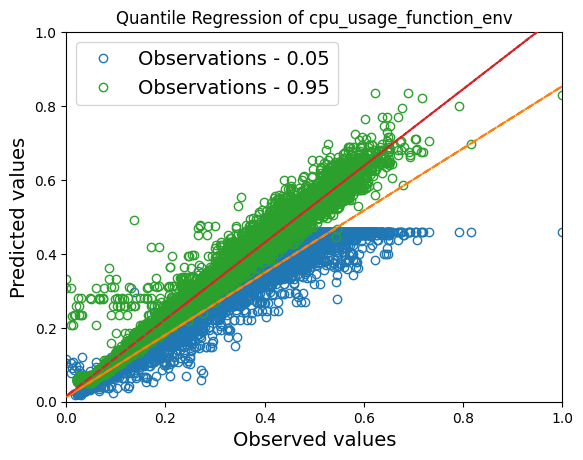

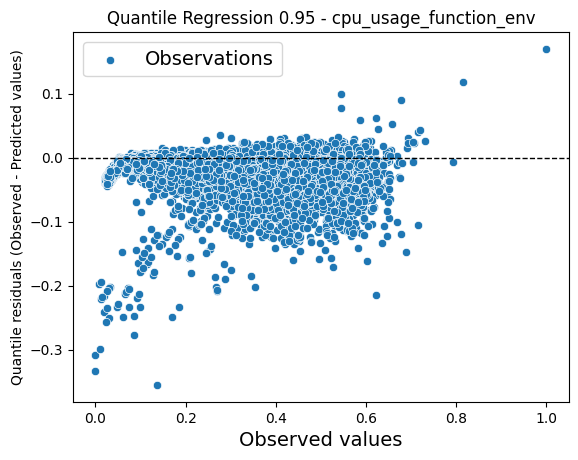

mape: 0.20772002543109078
mse: 1.3490000964964963
rmse: 1.1614646341996369
R-squared score: 0.9501625156644716
Standard deviation: 5.455606720519255
Quantile loss with library:  0.05416766279223957
------------------------------
Target: ram_usage_function_env
mape: 7.809330549881383
mse: 0.00659032220720491
rmse: 0.0811807994984338
R-squared score: 0.7981236888540811
Standard deviation: 0.1559251722584529


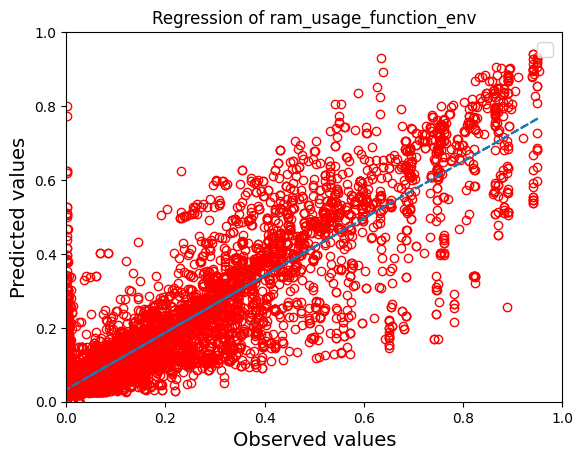

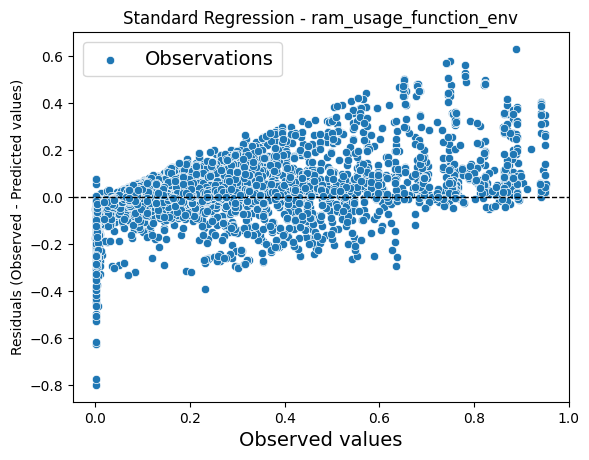

mape: 1.863870133592098
mse: 268235084228654.1
rmse: 16377883.997288968
R-squared score: 0.7981236888540812
Standard deviation: 31457246.039508518
------------------------------
Target: ram_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 5.063637607773368 % of cases and less or equal in 94.93636239222664 % of cases.
mape: 0.8353492714133164
mse: 0.029443778341149904
rmse: 0.17159189474200087
R-squared score: 0.09807120641064748
Standard deviation: 0.08344297664649321
Quantile loss with library:  0.005341376904908761
Prediction for alpha 0.95 are greater than true values in 95.53852470234023 % of cases and less or equal in 4.461475297659778 % of cases.
mape: 25.16265568484559
mse: 0.029212484774723286
rmse: 0.17091660181130236
R-squared score: 0.10515624573254012
Standard deviation: 0.20781846821343067
Quantile loss with library:  0.006458651345633889


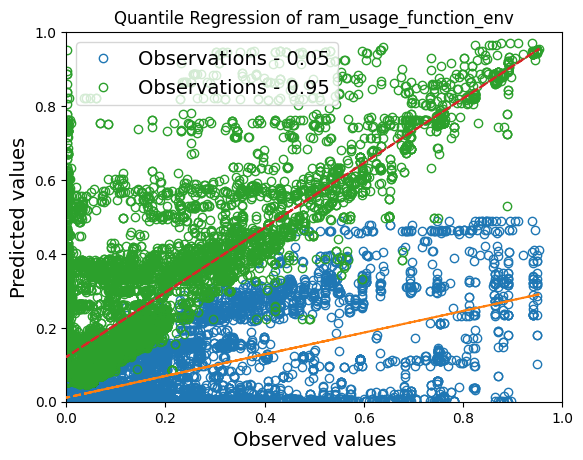

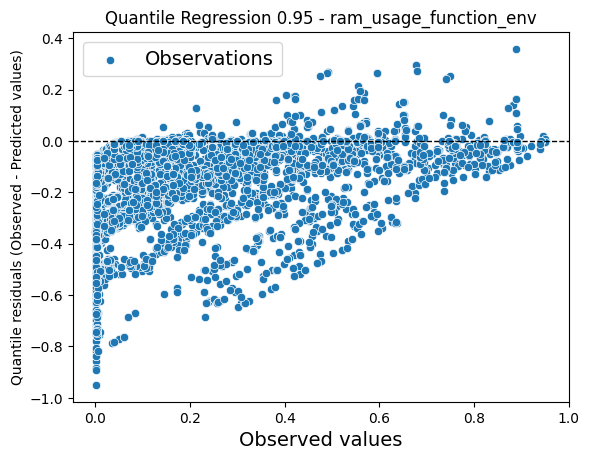

mape: 5.785068914145718
mse: 1188987892808886.5
rmse: 34481703.73993847
R-squared score: 0.10515624573254034
Standard deviation: 41926499.68863041
Quantile loss with library:  1303005.6758651026
------------------------------
Target: power_usage_function_env
mape: 0.1229694720346823
mse: 0.0010646578764498408
rmse: 0.032629095550594726
R-squared score: 0.9548843089723671
Standard deviation: 0.14939081430275425


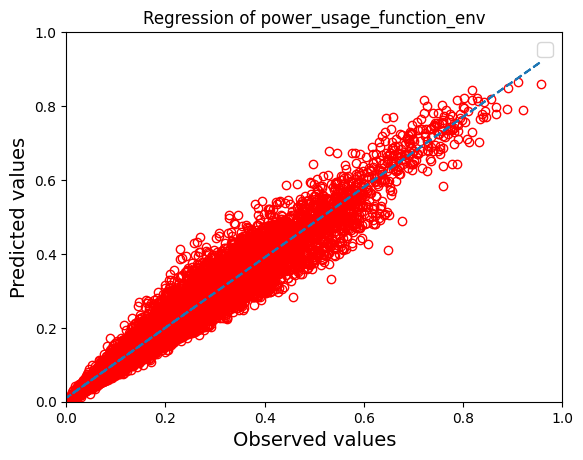

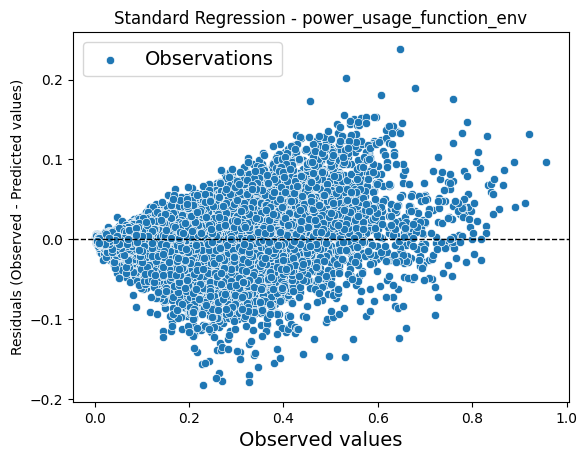

mape: 0.11274043706137948
mse: 8099848.414535486
rmse: 2846.0232631753884
R-squared score: 0.9548843089723671
Standard deviation: 13030.38670352
------------------------------
Target: power_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 5.179964417681675 % of cases and less or equal in 94.82003558231833 % of cases.
mape: 0.2237509374860999
mse: 0.0054753086250160675
rmse: 0.07399532839994744
R-squared score: 0.7679796132905456
Standard deviation: 0.11006250408542435
Quantile loss with library:  0.0029131170421199727
Prediction for alpha 0.95 are greater than true values in 95.01847543451485 % of cases and less or equal in 4.981524565485151 % of cases.
mape: 0.36602910789048393
mse: 0.004841788524458242
rmse: 0.06958296145219922
R-squared score: 0.7948255116291453
Standard deviation: 0.17821000015984886
Quantile loss with library:  0.003103426985928824


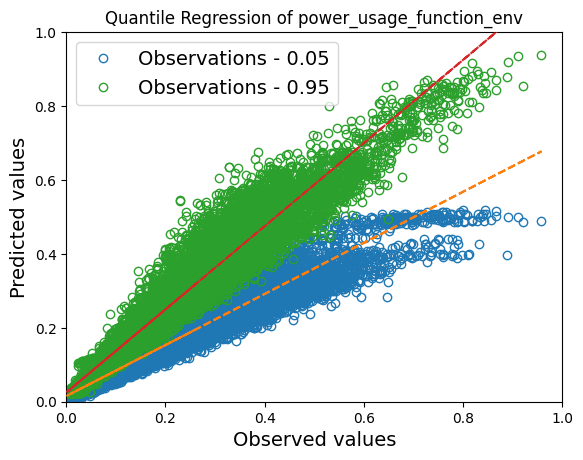

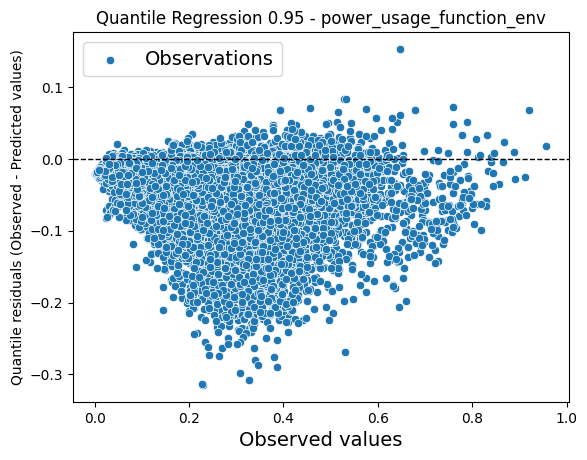

mape: 0.3200770810732316
mse: 36836014.62107519
rmse: 6069.268046566669
R-squared score: 0.7948255116291454
Standard deviation: 15544.096384742574
Quantile loss with library:  270.6917016386231
------------------------------
Target: medium_latency_function_env
mape: 28182324.246276814
mse: 0.00020275371726339014
rmse: 0.014239161396072106
R-squared score: 0.8821723694248507
Standard deviation: 0.03724441540533653


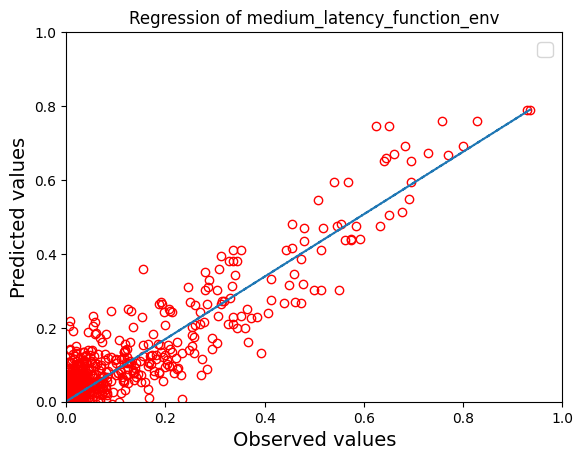

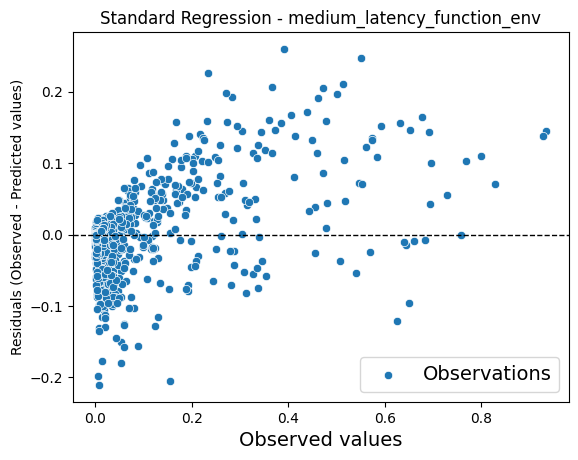

mape: 1.0723650301103445
mse: 1.3491463125053984e+17
rmse: 367307270.8925592
R-squared score: 0.8821723694248507
Standard deviation: 960740889.0172869
------------------------------
Target: medium_latency_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 5.303133981114001 % of cases and less or equal in 94.696866018886 % of cases.
mape: 4179740.0499634924
mse: 0.0017379397407081526
rmse: 0.041688604446636884
R-squared score: -0.009980603531978716
Standard deviation: 0.00030192663517067636
Quantile loss with library:  0.0002779156836584646
Prediction for alpha 0.95 are greater than true values in 95.44272615300396 % of cases and less or equal in 4.557273846996032 % of cases.
mape: 188007155.073695
mse: 0.000804182230170897
rmse: 0.02835810695675748
R-squared score: 0.5326601750606454
Standard deviation: 0.05435056725383361
Quantile loss with library:  0.0005656306692841814


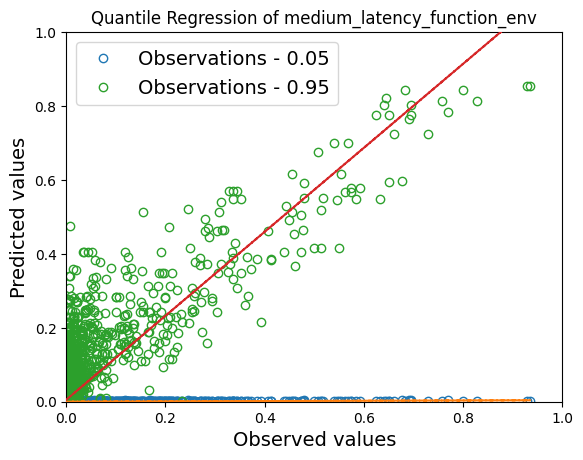

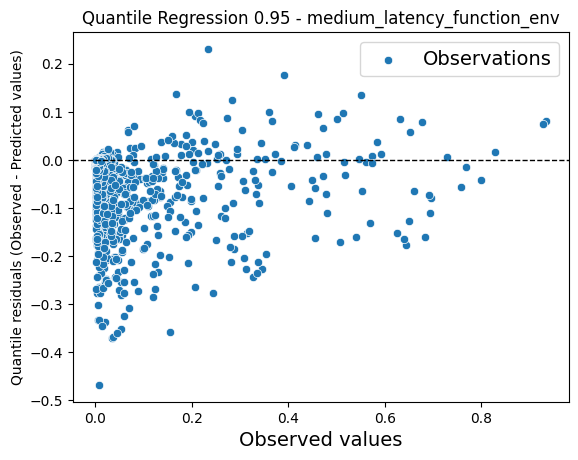

mape: 2.386258145904724
mse: 5.351120093191686e+17
rmse: 731513505.9034581
R-squared score: 0.5326601750606457
Standard deviation: 1402003810.0681293
Quantile loss with library:  14590764.98179277
------------------------------
Target: cpu_usage_function_figlet
mape: 0.049856611221427774
mse: 0.000343437164317879
rmse: 0.01853205774645328
R-squared score: 0.9913529580627451
Standard deviation: 0.19814390080318275


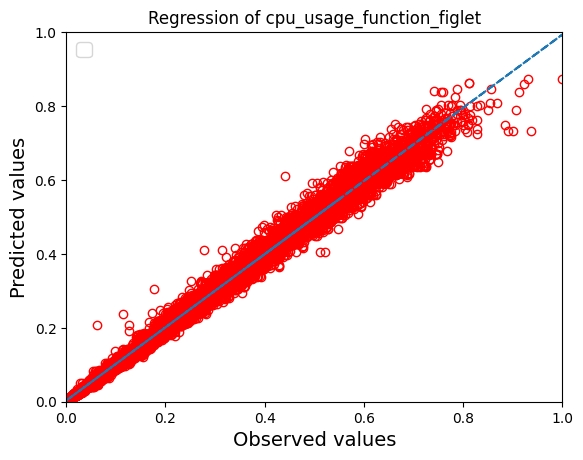

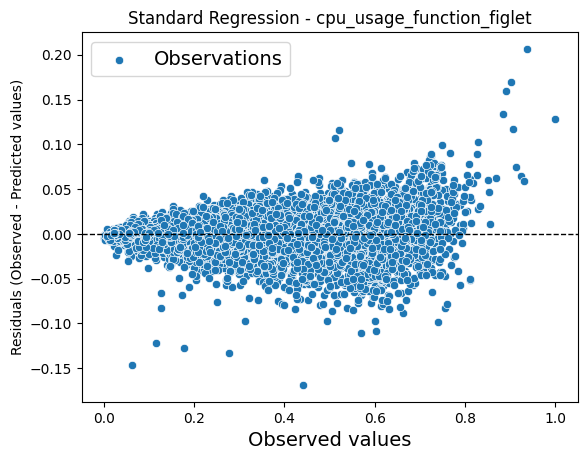

mape: 0.03927118806251907
mse: 0.5075271017569531
rmse: 0.7124093638891569
R-squared score: 0.9913529580627451
Standard deviation: 7.617047834675952
------------------------------
Target: cpu_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 4.817342432757928 % of cases and less or equal in 95.18265756724207 % of cases.
mape: 0.11163896878860288
mse: 0.0028825493498311565
rmse: 0.053689378370690384
R-squared score: 0.9274233318234419
Standard deviation: 0.17133549265833492
Quantile loss with library:  0.002090079936451332
Prediction for alpha 0.95 are greater than true values in 95.39676167536464 % of cases and less or equal in 4.603238324635353 % of cases.
mape: 0.3894971645383854
mse: 0.0015961090738374412
rmse: 0.03995133381800214
R-squared score: 0.9598132539752429
Standard deviation: 0.20341449676583828
Quantile loss with library:  0.001975448067658335


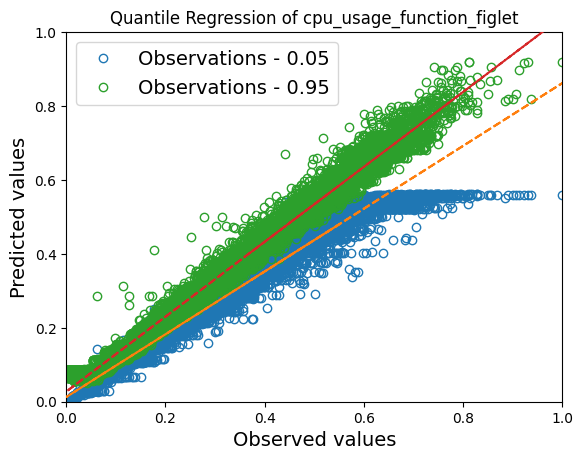

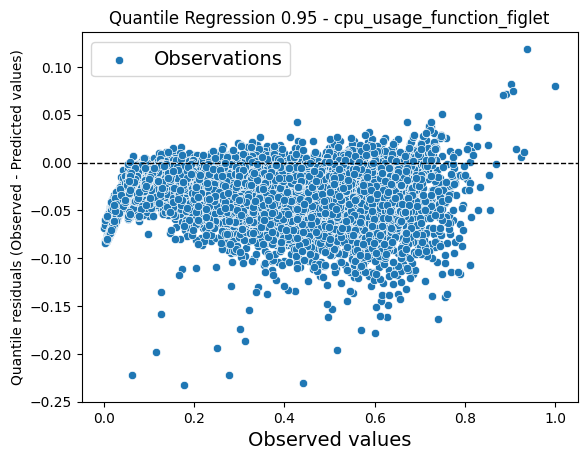

mape: 0.19208112457597637
mse: 2.358709820882714
rmse: 1.5358091746316382
R-squared score: 0.9598132539752429
Standard deviation: 7.819660084672355
Quantile loss with library:  0.07594017461692171
------------------------------
Target: ram_usage_function_figlet
mape: 3.482190398739296
mse: 0.0016465286638292515
rmse: 0.04057744033116494
R-squared score: 0.7649481113897266
Standard deviation: 0.07117659066673407


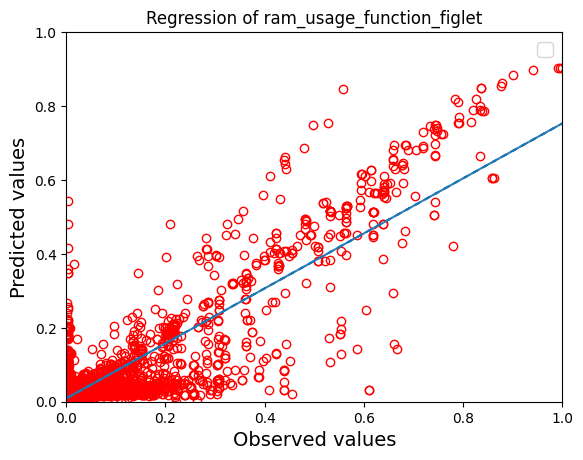

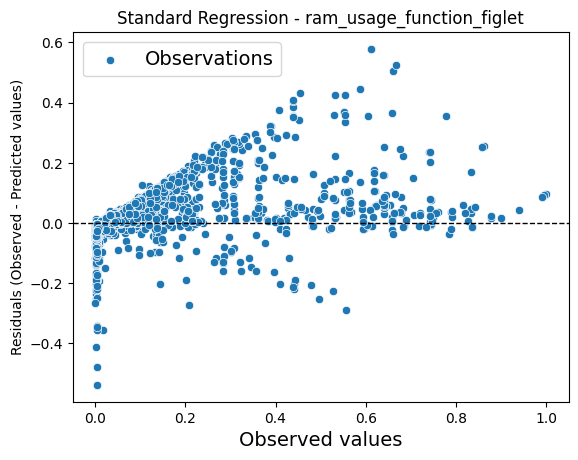

mape: 1.3768131299873396
mse: 77994466978253.38
rmse: 8831447.61509988
R-squared score: 0.7649481113897267
Standard deviation: 15491177.53028614
------------------------------
Target: ram_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 5.733975645657701 % of cases and less or equal in 94.2660243543423 % of cases.
mape: 0.4763662801973852
mse: 0.005713119817355246
rmse: 0.07558518252511696
R-squared score: 0.18441771927428163
Standard deviation: 0.02668958498662194
Quantile loss with library:  0.0014577562964657178
Prediction for alpha 0.95 are greater than true values in 95.22280208751506 % of cases and less or equal in 4.7771979124849455 % of cases.
mape: 14.944355548563935
mse: 0.007304333145988303
rmse: 0.08546539151017973
R-squared score: -0.04273757191099592
Standard deviation: 0.09719430617768965
Quantile loss with library:  0.00360129766666112


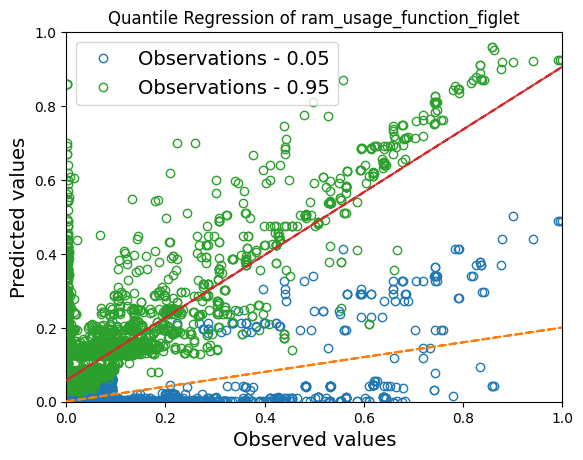

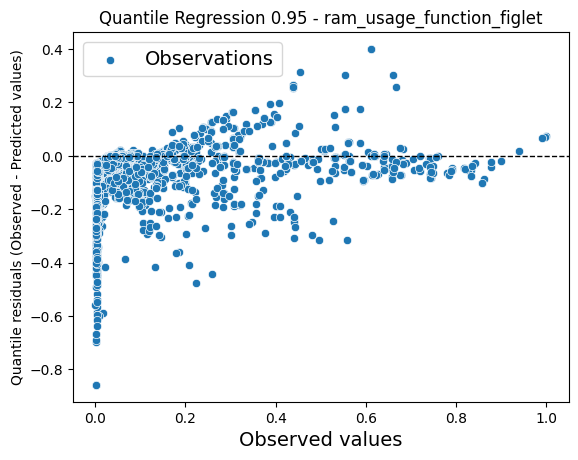

mape: 5.773086336570984
mse: 345999181713623.0
rmse: 18601053.242051188
R-squared score: -0.04273757191099525
Standard deviation: 21153784.38089867
Quantile loss with library:  783801.8226367022
------------------------------
Target: power_usage_function_figlet
mape: 0.10972147070947826
mse: 0.0013429915059556183
rmse: 0.036646848513284445
R-squared score: 0.9527467321315722
Standard deviation: 0.16390380617354214


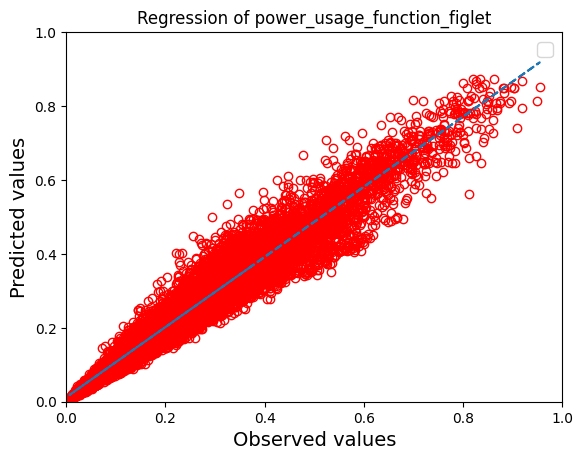

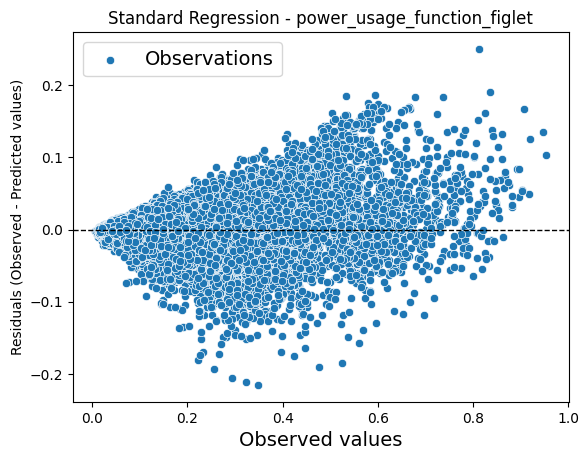

mape: 0.10915739946210831
mse: 9005055.983121928
rmse: 3000.8425455398237
R-squared score: 0.9527467321315722
Standard deviation: 13421.331844215283
------------------------------
Target: power_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 5.339221196306704 % of cases and less or equal in 94.66077880369329 % of cases.
mape: 0.20366619131074049
mse: 0.0056949189648794266
rmse: 0.07546468687326163
R-squared score: 0.7996238024268413
Standard deviation: 0.12951311376877025
Quantile loss with library:  0.00318919683832919
Prediction for alpha 0.95 are greater than true values in 94.53365448949552 % of cases and less or equal in 5.466345510504483 % of cases.
mape: 0.29840905371204474
mse: 0.005694798781395784
rmse: 0.07546389057950686
R-squared score: 0.7996280310927121
Standard deviation: 0.19181266657078033
Quantile loss with library:  0.003531354382256358


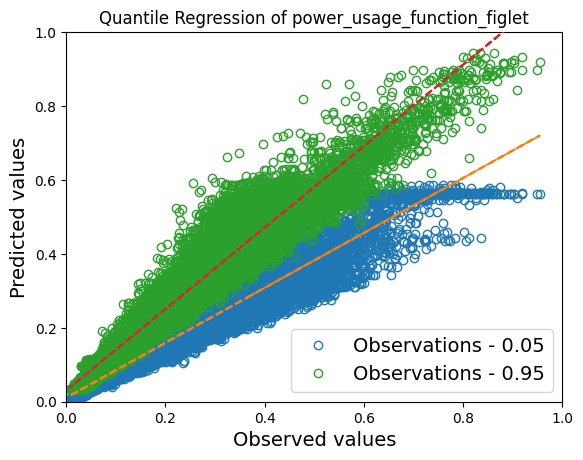

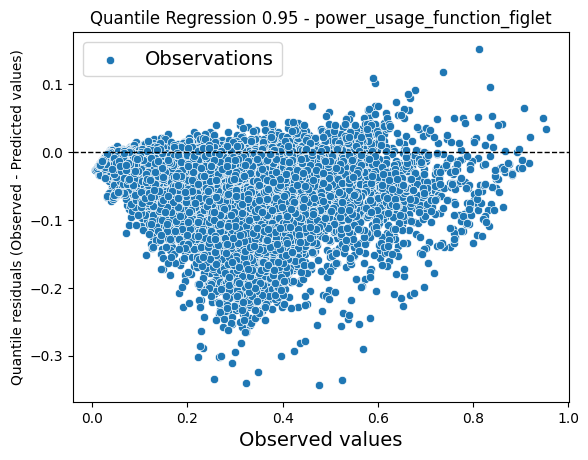

mape: 0.2963548259911352
mse: 38184889.190787084
rmse: 6179.392299473071
R-squared score: 0.7996280310927121
Standard deviation: 15706.660571655639
Quantile loss with library:  289.16643322854804
------------------------------
Target: medium_latency_function_figlet
mape: 1.5610060069097145
mse: 9.92262131255313e-05
rmse: 0.009961235522038986
R-squared score: 0.8987783667310202
Standard deviation: 0.029332113105642245


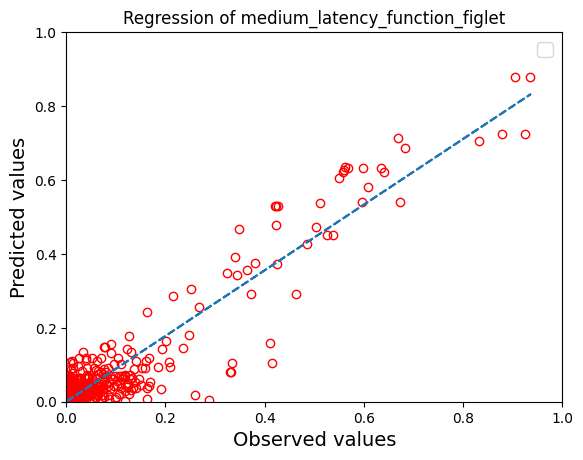

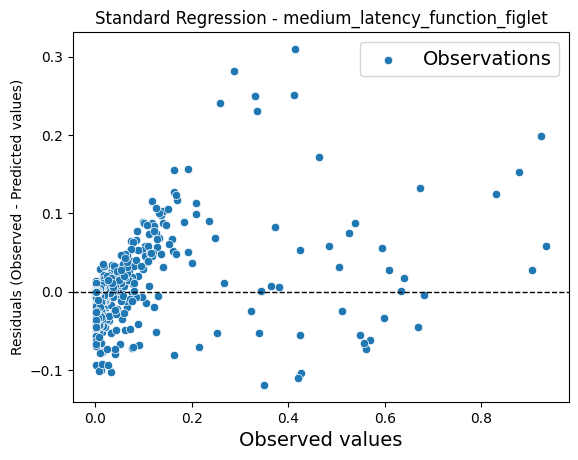

mape: 0.8401724644879418
mse: 6.031107270611223e+16
rmse: 245583127.89381975
R-squared score: 0.8987783667310202
Standard deviation: 723150463.4421527
------------------------------
Target: medium_latency_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 5.365984209822026 % of cases and less or equal in 94.63401579017797 % of cases.
mape: 0.366817475792903
mse: 0.000985290256453721
rmse: 0.03138933348215156
R-squared score: -0.005104254821108656
Standard deviation: 0.0002200448754672371
Quantile loss with library:  0.00016441949281983235
Prediction for alpha 0.95 are greater than true values in 94.8615014050582 % of cases and less or equal in 5.13849859494179 % of cases.
mape: 3.8598699953836766
mse: 0.00027788013184556955
rmse: 0.01666973700589093
R-squared score: 0.7165317519189827
Standard deviation: 0.03795068119070515
Quantile loss with library:  0.0003937703788463514


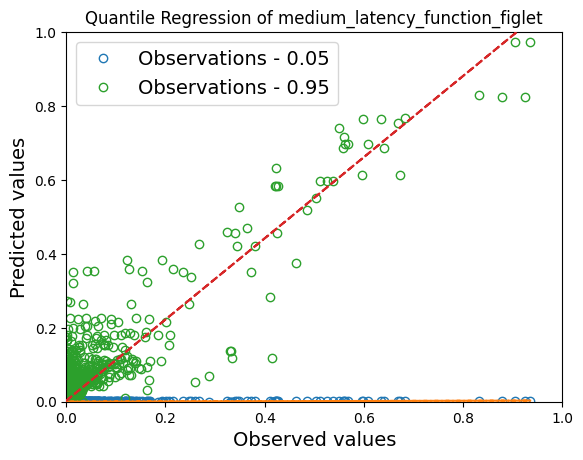

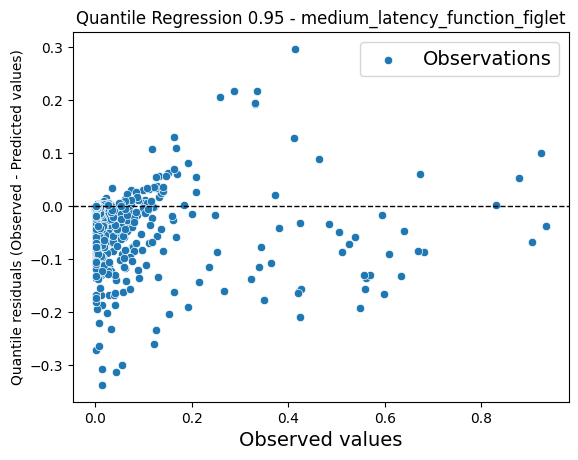

mape: 2.101328069474167
mse: 1.6889940981744454e+17
rmse: 410973733.73178554
R-squared score: 0.7165317519189827
Standard deviation: 935631626.4076029
Quantile loss with library:  9707968.564247642
------------------------------


In [356]:
all_metrics, all_metrics_no_scale = compute_metrics_and_plot(all_predictions, y_test_dict, y_scalers)

In [357]:
os.makedirs("output/metrics/functions", exist_ok = True)
all_metrics.to_csv("output/metrics/functions/all_metrics.csv")
all_metrics

,mape,mse,rmse,r2,quantile_loss,std_dev,metric
cpu_usage_function_curl,0.069465,0.00048,0.0219,0.987165,Not calculated for this target,0.191333,cpu_usage_function_curl
cpu_usage_function_curl quantiles,0.233999,0.002207,0.046979,0.940934,0.002177,0.203029,cpu_usage_function_curl quantiles
cpu_usage_function_eat-memory,0.062964,0.00029,0.017023,0.988515,Not calculated for this target,0.158111,cpu_usage_function_eat-memory
cpu_usage_function_eat-memory quantiles,0.191417,0.001254,0.035406,0.950313,0.001613,0.16896,cpu_usage_function_eat-memory quantiles
cpu_usage_function_env,57108317131.8116,0.000319,0.017851,0.987576,Not calculated for this target,0.159007,cpu_usage_function_env
cpu_usage_function_env quantiles,102615337067.600739,0.001278,0.035753,0.950163,0.001667,0.167937,cpu_usage_function_env quantiles
cpu_usage_function_figlet,0.049857,0.000343,0.018532,0.991353,Not calculated for this target,0.198144,cpu_usage_function_figlet
cpu_usage_function_figlet quantiles,0.389497,0.001596,0.039951,0.959813,0.001975,0.203414,cpu_usage_function_figlet quantiles
cpu_usage_function_nmap,0.058666,0.000473,0.021742,0.989254,Not calculated for this target,0.208066,cpu_usage_function_nmap
cpu_usage_function_nmap quantiles,0.199869,0.002244,0.047369,0.948992,0.002188,0.215108,cpu_usage_function_nmap quantiles


In [358]:
all_metrics_no_scale.to_csv("output/metrics/functions/all_metrics_no_scale.csv")
all_metrics_no_scale

,mape,mse,rmse,r2,quantile_loss,std_dev,metric
cpu_usage_function_curl,0.067023,8.018741,2.831738,0.987165,Not calculated for this target,24.740174,cpu_usage_function_curl
cpu_usage_function_curl quantiles,0.228458,36.900887,6.07461,0.940934,0.281433,26.25241,cpu_usage_function_curl quantiles
cpu_usage_function_eat-memory,0.050795,27.1867,5.214087,0.988515,Not calculated for this target,48.42946,cpu_usage_function_eat-memory
cpu_usage_function_eat-memory quantiles,0.144995,117.61049,10.844837,0.950313,0.493982,51.752306,cpu_usage_function_eat-memory quantiles
cpu_usage_function_env,0.076043,0.336304,0.579918,0.987576,Not calculated for this target,5.165495,cpu_usage_function_env
cpu_usage_function_env quantiles,0.20772,1.349,1.161465,0.950163,0.054168,5.455607,cpu_usage_function_env quantiles
cpu_usage_function_figlet,0.039271,0.507527,0.712409,0.991353,Not calculated for this target,7.617048,cpu_usage_function_figlet
cpu_usage_function_figlet quantiles,0.192081,2.35871,1.535809,0.959813,0.07594,7.81966,cpu_usage_function_figlet quantiles
cpu_usage_function_nmap,0.04625,60.275916,7.763757,0.989254,Not calculated for this target,74.297951,cpu_usage_function_nmap
cpu_usage_function_nmap quantiles,0.142475,286.113874,16.914901,0.948992,0.781171,76.812583,cpu_usage_function_nmap quantiles


### Run multiple training experiments to average results

In [359]:
rng = np.random.default_rng(seed = SEED)
all_metrics = pd.DataFrame()
all_metrics_no_scale = pd.DataFrame()
for exp in range(NUM_TRAINING_EXPERIMENTS):
    print(80*"#", f" {exp} ", 80*"#")
    # experiment folder
    exp_folder = f"output/metrics/functions/exp_{exp}"
    os.makedirs(exp_folder, exist_ok = True)
    # set seed
    seed = int(rng.integers(0, SEED**2))
    np.random.seed(seed)
    with open(os.path.join(exp_folder, "seed.txt"), "w") as ostream:
        ostream.write(str(seed))
    # train/test split
    x_train_dict, x_test_dict, y_train_dict, y_test_dict, y_scalers = build_train_test_data(targets, target_datasets, features_datasets)
    # train models
    trained_models = train_all_models(targets, x_train_dict, y_train_dict)
    # evaluate models
    all_predictions = evaluate_all_models(trained_models, targets, params, x_test_dict, y_test_dict)
    # compute metrics
    exp_metrics, exp_metrics_no_scale = compute_metrics_and_plot(all_predictions, y_test_dict, y_scalers, plot_folder = exp_folder)
    exp_metrics.to_csv(os.path.join(exp_folder, "all_metrics.csv"), index = False)
    exp_metrics_no_scale.to_csv(os.path.join(exp_folder, "all_metrics_no_scale.csv"), index = False)
    # merge
    exp_metrics["exp"] = [exp] * len(exp_metrics)
    exp_metrics_no_scale["exp"] = [exp] * len(exp_metrics_no_scale)
    all_metrics = pd.concat([all_metrics, exp_metrics], ignore_index = True)
    all_metrics_no_scale = pd.concat([all_metrics_no_scale, exp_metrics_no_scale], ignore_index = True)

################################################################################  0  ################################################################################
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.278805
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 103
[LightGBM] [Info] Number of data points in the train set: 54008, number of used features: 7
[LightGBM] [Info] Start training from score 0.037536
[LightGBM] [Info] Auto-cho

In [360]:
for col in all_metrics:
  if col != "metric" and col != "quantile_loss":
    all_metrics[col] = all_metrics[col].astype(float)
all_metrics.to_csv("output/metrics/functions/all_metrics.csv", index = False)
#
for col in all_metrics_no_scale:
  if col != "metric" and col != "quantile_loss":
    all_metrics_no_scale[col] = all_metrics_no_scale[col].astype(float)
all_metrics_no_scale.to_csv("output/metrics/functions/all_metrics_no_scale.csv", index = False)

In [361]:
# standard metrics
all_metrics[~all_metrics["metric"].str.contains("quantiles")].groupby("metric").mean(numeric_only = True)

,mape,mse,rmse,r2,std_dev,exp
metric,,,,,,
cpu_usage_function_curl,1.648937e-01,0.000514,0.022681,0.986267,0.191949,2.0
cpu_usage_function_eat-memory,5.557417e+09,0.000284,0.016855,0.989172,0.160776,2.0
cpu_usage_function_env,2.412078e+10,0.000304,0.017436,0.988211,0.159403,2.0
cpu_usage_function_figlet,2.115591e+08,0.000325,0.018032,0.991695,0.196940,2.0
cpu_usage_function_nmap,1.659719e+10,0.000462,0.021487,0.989749,0.210700,2.0
cpu_usage_function_shasum,8.820391e+09,0.000292,0.017079,0.988773,0.160158,2.0
cpu_usage_node,7.551022e+08,0.000568,0.023836,0.983637,0.184358,2.0
medium_latency_function_curl,2.475802e+08,0.000706,0.026572,0.986773,0.226992,2.0
medium_latency_function_eat-memory,5.461016e+09,0.001331,0.036475,0.962286,0.178758,2.0


In [362]:
# quantile metrics
quantile_metrics = all_metrics[all_metrics["metric"].str.contains("quantiles")]
quantile_metrics["quantile_loss"] = quantile_metrics["quantile_loss"].astype(float)
quantile_metrics.groupby("metric").mean(numeric_only = True)

,mape,mse,rmse,r2,quantile_loss,std_dev,exp
metric,,,,,,,
cpu_usage_function_curl quantiles,4.419796e-01,0.002373,0.048712,0.936654,0.002221,0.203709,2.0
cpu_usage_function_eat-memory quantiles,1.876336e+10,0.001169,0.034186,0.955451,0.001566,0.172115,2.0
cpu_usage_function_env quantiles,4.033640e+10,0.001231,0.035086,0.952257,0.001650,0.167738,2.0
cpu_usage_function_figlet quantiles,4.084621e+09,0.001616,0.040193,0.958746,0.001978,0.201985,2.0
cpu_usage_function_nmap quantiles,5.601499e+10,0.002296,0.047911,0.949031,0.002182,0.217131,2.0
cpu_usage_function_shasum quantiles,1.793363e+10,0.001129,0.033597,0.956561,0.001559,0.168651,2.0
cpu_usage_node quantiles,5.026802e+09,0.003330,0.057701,0.904105,0.002858,0.193938,2.0
medium_latency_function_curl quantiles,1.320126e+09,0.013678,0.116933,0.743942,0.004166,0.248889,2.0
medium_latency_function_eat-memory quantiles,6.308280e+10,0.016256,0.127347,0.538589,0.005710,0.176874,2.0


In [363]:
# standard metrics
all_metrics_no_scale[~all_metrics_no_scale["metric"].str.contains("quantiles")].groupby("metric").mean(numeric_only = True)

,mape,mse,rmse,r2,std_dev,exp
metric,,,,,,
cpu_usage_function_curl,0.076756,8.601602e+00,2.932679e+00,0.986267,2.481973e+01,2.0
cpu_usage_function_eat-memory,0.050003,2.668271e+01,5.162788e+00,0.989172,4.924572e+01,2.0
cpu_usage_function_env,0.060136,3.208534e-01,5.664121e-01,0.988211,5.178351e+00,2.0
cpu_usage_function_figlet,0.038765,4.805633e-01,6.932046e-01,0.991695,7.570780e+00,2.0
cpu_usage_function_nmap,0.047092,5.888295e+01,7.672794e+00,0.989749,7.523850e+01,2.0
cpu_usage_function_shasum,0.052945,3.032280e-01,5.506243e-01,0.988773,5.163322e+00,2.0
cpu_usage_node,0.035683,9.684385e+01,9.840416e+00,0.983637,7.611079e+01,2.0
medium_latency_function_curl,0.295175,5.518497e+17,7.428346e+08,0.986773,6.345581e+09,2.0
medium_latency_function_eat-memory,0.212836,9.187664e+17,9.583753e+08,0.962286,4.696790e+09,2.0


In [364]:
# quantile metrics
quantile_metrics_no_scale = all_metrics_no_scale[all_metrics_no_scale["metric"].str.contains("quantiles")]
quantile_metrics_no_scale["quantile_loss"] = quantile_metrics_no_scale["quantile_loss"].astype(float)
quantile_metrics_no_scale.groupby("metric").mean(numeric_only = True)

,mape,mse,rmse,r2,quantile_loss,std_dev,exp
metric,,,,,,,
cpu_usage_function_curl quantiles,0.255322,3.967635e+01,6.298594e+00,0.936654,2.872246e-01,2.634041e+01,2.0
cpu_usage_function_eat-memory quantiles,0.135190,1.096832e+02,1.047129e+01,0.955451,4.797067e-01,5.271868e+01,2.0
cpu_usage_function_env quantiles,0.188023,1.299401e+00,1.139808e+00,0.952257,5.360520e-02,5.449152e+00,2.0
cpu_usage_function_figlet quantiles,0.195406,2.387373e+00,1.545092e+00,0.958746,7.605075e-02,7.764713e+00,2.0
cpu_usage_function_nmap quantiles,0.148015,2.927355e+02,1.710856e+01,0.949031,7.791394e-01,7.753527e+01,2.0
cpu_usage_function_shasum quantiles,0.150740,1.173269e+00,1.083137e+00,0.956561,5.026776e-02,5.437131e+00,2.0
cpu_usage_node quantiles,0.111357,5.674926e+02,2.382159e+01,0.904105,1.179741e+00,8.006572e+01,2.0
medium_latency_function_curl quantiles,2.012821,1.068940e+19,3.268885e+09,0.743942,1.164596e+08,6.957712e+09,2.0
medium_latency_function_eat-memory quantiles,1.388487,1.122234e+19,3.345992e+09,0.538589,1.500299e+08,4.647272e+09,2.0
